***NOTE: The following notebook was written and tested <u>only</u> inside Kaggle.***


___
# Ioannou_Georgios


## Copyright © 2022 by Georgios Ioannou


___
<h1 align="center"> Voice Emotion Recognition of Audio </h1>
<h2 align="center"> Speech Emotion Recognition </h2>

In this notebook, we will be classifying emotion based on audio. The datasets we will be using are called:
1. [`RAVDESS Emotional Speech Audio`](https://www.kaggle.com/datasets/uwrfkaggler/ravdess-emotional-speech-audio/versions/1)
2. [`Crowd Sourced Emotional Multimodal Actors Dataset (CREMA-D)`](https://www.kaggle.com/datasets/ejlok1/cremad/versions/1)
3. [`Surrey Audio-Visual Expressed Emotion (SAVEE)`](https://www.kaggle.com/datasets/ejlok1/surrey-audiovisual-expressed-emotion-savee/versions/1)
4. [`Toronto Emotional Speech Set (TESS)`](https://www.kaggle.com/datasets/ejlok1/toronto-emotional-speech-set-tess/versions/1)


___
<h2 align="center"> Remember our main steps motto "ISBE" </h2>

<h3 align="center"> Main Steps when building a Machine Learning Model </h3>

1. **I** - `Inspect and explore data`
2. **S** - `Select and engineer features`
3. **B** - `Build and train model`
4. **E** - `Evaluate model`


___
<h2 align="center"> Libraries </h2>


In [1]:
# import libraries.

# Use inline so our visualizations display in notebook.


%matplotlib inline


import IPython                    # Play audio files.
import librosa                    # Music and audio analysis.
import librosa.display            # Data visualization
import matplotlib.pyplot as plt   # Data visualization.
import numpy as np                # Data wrangling.
import os                         # Manipulate operating system interfaces.
import pandas as pd               # Data handling.
import pickle                     # Python object serialization.
import plotly.express as px       # Data visualization
import plotly.graph_objects as go # Data visualization
import seaborn as sns             # Data visualization.
sns.set()
import warnings                   # Ignore all warnings.
warnings.filterwarnings('ignore')


!pip install antropy                             # Install antropy.
from antropy import spectral_entropy             # Spectral entropy.
from keras.utils import np_utils                 # Keras utilities.
from keras.utils.np_utils import to_categorical  # Convert a class vector (integers) to binary class matrix.
from pydub import AudioSegment                   # Represent audio segments of audio that can be manipulated using Python code.
from pydub.silence import split_on_silence       # Return a list of audio segments (audio chunks) from splitting audio_segment on silent sections.
from sklearn.preprocessing import LabelEncoder   # To encode target labels with value between 0 and n_classes-1.
from sklearn.preprocessing import StandardScaler # To perform standardization by centering and scaling.
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, multilabel_confusion_matrix, precision_score, recall_score
from sklearn.model_selection import train_test_split # To split data in training/validating/testing.
from statistics import mode                          # Find the most likely predicted emotion.
from tensorflow.keras import models                  # Group layers into an object with training and inference features.
from tensorflow.keras import layers                  # Keras layers API.
from tensorflow.keras.callbacks import EarlyStopping     # Stop training when a monitored metric has stopped improving.
from tensorflow.keras.callbacks import ReduceLROnPlateau # Reduce learning rate when a metric has stopped improving.
from tensorflow.keras.models import load_model           # To load the model.
from tqdm.auto import tqdm                               # Progress bar.


  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.5/49.5 kB 656.3 kB/s eta 0:00:00 0:00:01
  Created wheel for antropy: filename=antropy-0.1.4-py3-none-any.whl size=16159 sha256=5fb79b3d339560e4094e6183a73137d7a3702a1223b7b43deb19fd597e1fd934
  Stored in directory: /root/.cache/pip/wheels/d4/cc/6b/28fa7036bdabc6f1f92fd6a108ae259dbb48f107f676d6b491
Successfully built antropy


___
## #1 Inspect and Explore Data


## 1.1 List All Files Under the Input Directory to See the Number of Files


In [2]:
files_list = []
files_count = 0

for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        files_list.append(os.path.join(dirname, filename))
        files_count += 1

# Remove the file /kaggle/input/videodemographics/VideoDemographics.csv as it is not an audio file.
files_list.remove('/kaggle/input/videodemographics/VideoDemographics.csv')

print('\nLength of files_list=', len(files_list))
print('files_list[0]=', files_list[0])
print('files_list[12161]=', files_list[12161])
print('files_count(audio files)=', files_count - 1)



Length of files_list= 12175
files_list[0]= /kaggle/input/torontoemotionalspeechsettess/YAF_fear/YAF_home_fear.wav
files_list[12161]= /kaggle/input/cremad/AudioWAV/1062_ITH_ANG_XX.wav
files_count(audio files)= 12175


## 1.2 Import Datasets Paths


In [3]:
RAVDESS_PATH = '../input/ravdessemotionalspeechaudio'
CREMAD_PATH  = '../input/cremad/AudioWAV/'
SAVEE_PATH   = '../input/surrey-audiovisual-expressed-emotion-savee/ALL/'
TESS_PATH    = '../input/torontoemotionalspeechsettess'


## 1.3 Prepare the Data of the RAVDESS Dataset


In [4]:
# Accessing inner files.
# List comprehension gets rid of hidden files.
ravdess_dir_list = [x for x in os.listdir(RAVDESS_PATH) if not x.startswith('.')]
print('Ravdess:\n', sorted(ravdess_dir_list))


Ravdess:
 ['Actor_01', 'Actor_02', 'Actor_03', 'Actor_04', 'Actor_05', 'Actor_06', 'Actor_07', 'Actor_08', 'Actor_09', 'Actor_10', 'Actor_11', 'Actor_12', 'Actor_13', 'Actor_14', 'Actor_15', 'Actor_16', 'Actor_17', 'Actor_18', 'Actor_19', 'Actor_20', 'Actor_21', 'Actor_22', 'Actor_23', 'Actor_24']


In [5]:
# Create df columns.
emotion = []
gender = []
location = []

# Iterate over inner folders.
for actor_file in ravdess_dir_list:
    actor_wavs = [x for x in os.listdir(RAVDESS_PATH + '/' + actor_file) if not x.startswith('.')]
    # Iterate over .wav files.
    for wav in actor_wavs:
        partition = wav.split('-')
        emotion_num = int(partition[2])
        
        emotion.append(emotion_num)
        actor_num = int(partition[6].split('.')[0])
        
        if (actor_num%2 == 0): gender.append('female')
        else: gender.append('male')
        
        location.append(RAVDESS_PATH + '/' + actor_file + '/' + wav)

# Initialize dataframe.
ravdess_df = pd.DataFrame({'gender': gender, 'emotion': emotion, 'location': location },
                          columns=['gender','emotion', 'location'])

# Swap numerical value to label.
ravdess_df = ravdess_df.replace({"emotion": {1:'neutral', 2:'calm', 3:'happy', 4:'sad',
                                5:'angry', 6:'fear', 7:'disgust', 8:'surprise'}})

print('ravdess_df.shape=', ravdess_df.shape, '\n')
print('Unique emotions = ', sorted(ravdess_df['emotion'].unique()), '\n')
print('# of Unique emotions = ', len(ravdess_df['emotion'].unique()), '\n')
print(ravdess_df.emotion.value_counts(), '\n')
ravdess_df


ravdess_df.shape= (1440, 3) 

Unique emotions =  ['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise'] 

# of Unique emotions =  8 

surprise    192
disgust     192
fear        192
sad         192
calm        192
happy       192
angry       192
neutral      96
Name: emotion, dtype: int64 



,gender,emotion,location
0,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
1,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
2,female,disgust,../input/ravdessemotionalspeechaudio/Actor_02/...
3,female,disgust,../input/ravdessemotionalspeechaudio/Actor_02/...
4,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
...,...,...,...
1435,male,fear,../input/ravdessemotionalspeechaudio/Actor_07/...
1436,male,angry,../input/ravdessemotionalspeechaudio/Actor_07/...
1437,male,sad,../input/ravdessemotionalspeechaudio/Actor_07/...
1438,male,disgust,../input/ravdessemotionalspeechaudio/Actor_07/...


## 1.4 Prepare the Data of the CREMA-D Dataset


In [6]:
# Creating dictionary from CREMA github documentation on actors' gender.
Crema_genders = pd.read_csv('../input/videodemographics/VideoDemographics.csv')
select_cond = ['ActorID', 'Sex']

# Looks like this: {1001: 'female'}
extraction = Crema_genders[select_cond]
extraction_dict = dict(extraction.values)


# Processing CREMA Dataset.

emotion = []
intensity = []
gender = []
location = []

wavs = [x for x in os.listdir(CREMAD_PATH) if not x.startswith('.')]

for wav in wavs:
    partition = wav.split('_')
    emotion_ = partition[2]
    intensity_ = partition[3].split('.')[0]
    actor_ID = int(partition[0])
    
    # looks up the dictionary made in prev cell
    if actor_ID in extraction_dict: gender.append(extraction_dict.get(actor_ID))
    
    intensity.append(intensity_)
    emotion.append(emotion_) 
    location.append(CREMAD_PATH + '/' + wav)

crema_df = pd.DataFrame({'gender': gender, 'emotion': emotion, 'location': location}, 
                        columns=['gender','emotion', 'location'])

crema_df = crema_df.replace({'emotion': {'ANG':'angry','DIS': 'disgust',
                                        'FEA': 'fear','HAP': 'happy',
                                        'NEU': 'neutral','SAD': 'sad'}})

crema_df = crema_df.replace({'intensity': {'LO': 'low','MD': 'medium',
                                            'HI': 'high','XX': 'unspecified'}})                           

print('crema_df.shape=', crema_df.shape, '\n')
print('Unique emotions = ', sorted(crema_df['emotion'].unique()), '\n')
print('# of Unique emotions = ', len(crema_df['emotion'].unique()), '\n')
print(crema_df.emotion.value_counts(), '\n')
crema_df


crema_df.shape= (7442, 3) 

Unique emotions =  ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad'] 

# of Unique emotions =  6 

disgust    1271
happy      1271
sad        1271
fear       1271
angry      1271
neutral    1087
Name: emotion, dtype: int64 



,gender,emotion,location
0,Female,disgust,../input/cremad/AudioWAV//1028_TSI_DIS_XX.wav
1,Female,happy,../input/cremad/AudioWAV//1075_IEO_HAP_LO.wav
2,Female,happy,../input/cremad/AudioWAV//1084_ITS_HAP_XX.wav
3,Male,disgust,../input/cremad/AudioWAV//1067_IWW_DIS_XX.wav
4,Male,disgust,../input/cremad/AudioWAV//1066_TIE_DIS_XX.wav
...,...,...,...
7437,Female,angry,../input/cremad/AudioWAV//1060_IEO_ANG_MD.wav
7438,Male,angry,../input/cremad/AudioWAV//1088_IWL_ANG_XX.wav
7439,Male,angry,../input/cremad/AudioWAV//1050_IOM_ANG_XX.wav
7440,Male,sad,../input/cremad/AudioWAV//1044_IWL_SAD_XX.wav


## 1.5 Prepare the Data of the SAVEE Dataset


In [7]:
location = []
gender = []
emotion = []

wavs = [x for x in os.listdir(SAVEE_PATH) if not x.startswith('.')]

for wav in wavs:
    partition = wav.split('_')
    emotion_ = partition[1].split('.')[0]
    emotion_ = ''.join(i for i in emotion_ if not i.isdigit())
    
    emotion.append(emotion_)
    gender.append('male')
    location.append(SAVEE_PATH + '/' + wav)

savee_df = pd.DataFrame({'gender': gender, 'emotion': emotion, 'location': location},
                        columns=['gender','emotion','location'])

savee_df = savee_df.replace({'emotion': {'a':'angry','d': 'disgust','f': 'fear','h': 'happy',
                                         'n': 'neutral','sa': 'sad', 'su': 'surprise'}})
print('savee_df.shape=', savee_df.shape, '\n')
print('Unique emotions = ', sorted(savee_df['emotion'].unique()), '\n')
print('# of Unique emotions = ', len(savee_df['emotion'].unique()), '\n')
print(savee_df.emotion.value_counts(), '\n')
savee_df


savee_df.shape= (480, 3) 

Unique emotions =  ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise'] 

# of Unique emotions =  7 

neutral     120
happy        60
fear         60
disgust      60
angry        60
surprise     60
sad          60
Name: emotion, dtype: int64 



,gender,emotion,location
0,male,happy,../input/surrey-audiovisual-expressed-emotion-...
1,male,fear,../input/surrey-audiovisual-expressed-emotion-...
2,male,happy,../input/surrey-audiovisual-expressed-emotion-...
3,male,disgust,../input/surrey-audiovisual-expressed-emotion-...
4,male,angry,../input/surrey-audiovisual-expressed-emotion-...
...,...,...,...
475,male,surprise,../input/surrey-audiovisual-expressed-emotion-...
476,male,neutral,../input/surrey-audiovisual-expressed-emotion-...
477,male,neutral,../input/surrey-audiovisual-expressed-emotion-...
478,male,angry,../input/surrey-audiovisual-expressed-emotion-...


## 1.6 Prepare the Data of the TESS Dataset


In [8]:
# Accessing inner files.
# List comprehension gets rid of hidden files.
tess_dir_list = [x for x in os.listdir(TESS_PATH) if not x.startswith('.')]
print('Tess:\n', sorted(tess_dir_list))


Tess:
 ['OAF_Fear', 'OAF_Pleasant_surprise', 'OAF_Sad', 'OAF_angry', 'OAF_disgust', 'OAF_happy', 'OAF_neutral', 'YAF_angry', 'YAF_disgust', 'YAF_fear', 'YAF_happy', 'YAF_neutral', 'YAF_pleasant_surprised', 'YAF_sad']


In [9]:
# Create df columns.
emotion = []
gender = []
location = []

# Iterate over inner folders.
for actor_file in tess_dir_list:
    actor_wavs = [x for x in os.listdir(TESS_PATH + '/' + actor_file) if not x.startswith('.')]
    
    # Iterate over .wav files
    for wav in actor_wavs:
        partition = actor_wavs[0].split('_')
        emotion_ = partition[2].split('.')[0]
        emotion.append(emotion_)
        gender.append('female')
        location.append(TESS_PATH + '/' + actor_file + '/' + wav)

# Initializing dataframe.
tess_df = pd.DataFrame({'gender': gender, 'emotion': emotion, 'location': location },
                       columns=['gender','emotion','location'])

# Swapping 'ps' to 'pleasant surprise'.
tess_df = tess_df.replace({'emotion': {'ps':'pleasant surprise'}})

print('tess_df.shape=', tess_df.shape, '\n')
print('Unique emotions = ', sorted(tess_df['emotion'].unique()), '\n')
print('# of Unique emotions = ', len(tess_df['emotion'].unique()), '\n')
print(tess_df.emotion.value_counts(), '\n')
tess_df


tess_df.shape= (2800, 3) 

Unique emotions =  ['angry', 'disgust', 'fear', 'happy', 'neutral', 'pleasant surprise', 'sad'] 

# of Unique emotions =  7 

fear                 400
angry                400
disgust              400
neutral              400
sad                  400
pleasant surprise    400
happy                400
Name: emotion, dtype: int64 



,gender,emotion,location
0,female,fear,../input/torontoemotionalspeechsettess/YAF_fea...
1,female,fear,../input/torontoemotionalspeechsettess/YAF_fea...
2,female,fear,../input/torontoemotionalspeechsettess/YAF_fea...
3,female,fear,../input/torontoemotionalspeechsettess/YAF_fea...
4,female,fear,../input/torontoemotionalspeechsettess/YAF_fea...
...,...,...,...
2795,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2796,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2797,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2798,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...


## 1.7 Merge All Dataframes To One Dataframe

In [10]:
combined_df = pd.concat([ravdess_df, crema_df, savee_df, tess_df],axis=0)

print('combined_df.shape=', combined_df.shape, '\n')

print('Unique emotions = ', sorted(combined_df['emotion'].unique()), '\n')
print('# of Unique emotions = ', len(combined_df['emotion'].unique()), '\n')

print('Unique genders = ', combined_df['gender'].unique(), '\n')
print('# of Unique genders = ', len(combined_df['gender'].unique()), '\n')

print(combined_df.emotion.value_counts(), '\n')

print(combined_df.gender.value_counts(), '\n')


combined_df


combined_df.shape= (12162, 3) 

Unique emotions =  ['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'pleasant surprise', 'sad', 'surprise'] 

# of Unique emotions =  9 

Unique genders =  ['female' 'male' 'Female' 'Male'] 

# of Unique genders =  4 

disgust              1923
fear                 1923
sad                  1923
happy                1923
angry                1923
neutral              1703
pleasant surprise     400
surprise              252
calm                  192
Name: emotion, dtype: int64 

Male      3930
female    3520
Female    3512
male      1200
Name: gender, dtype: int64 



,gender,emotion,location
0,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
1,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
2,female,disgust,../input/ravdessemotionalspeechaudio/Actor_02/...
3,female,disgust,../input/ravdessemotionalspeechaudio/Actor_02/...
4,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
...,...,...,...
2795,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2796,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2797,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2798,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...


## 1.8 Replace Redundant Data

In [11]:
# Replace 'Female' with 'female'
combined_df['gender'] = combined_df['gender'].replace('Female', 'female')

# Replace 'Male' with 'male'
combined_df['gender'] = combined_df['gender'].replace('Male', 'male')

# Replace 'pleasant surprise' with 'surprise'
combined_df['emotion'] = combined_df['emotion'].replace('pleasant surprise', 'surprise')


print('combined_df.shape=', combined_df.shape, '\n')

print('Unique emotions = ', sorted(combined_df['emotion'].unique()), '\n')
print('# of Unique emotions = ', len(combined_df['emotion'].unique()), '\n')

print('Unique genders = ', combined_df['gender'].unique(), '\n')
print('# of Unique genders = ', len(combined_df['gender'].unique()), '\n')

print(combined_df.emotion.value_counts(), '\n')

print(combined_df.gender.value_counts(), '\n')


combined_df


combined_df.shape= (12162, 3) 

Unique emotions =  ['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise'] 

# of Unique emotions =  8 

Unique genders =  ['female' 'male'] 

# of Unique genders =  2 

disgust     1923
fear        1923
sad         1923
happy       1923
angry       1923
neutral     1703
surprise     652
calm         192
Name: emotion, dtype: int64 

female    7032
male      5130
Name: gender, dtype: int64 



,gender,emotion,location
0,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
1,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
2,female,disgust,../input/ravdessemotionalspeechaudio/Actor_02/...
3,female,disgust,../input/ravdessemotionalspeechaudio/Actor_02/...
4,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
...,...,...,...
2795,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2796,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2797,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2798,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...


## 1.9 Inspect / Remove NULL Values


In [12]:
print(combined_df.isnull().sum())
print()
print('combined_df.isnull().sum().sum() = ', combined_df.isnull().sum().sum())


gender      0
emotion     0
location    0
dtype: int64

combined_df.isnull().sum().sum() =  0


### ***Note: The audio file in cremad/AudioWAV//1076_MTI_SAD_XX.wav is labeled as sad but it is actually an empty audio file. Therefore, there is a need to delete it.***


In [13]:
print('combined_df.shape =', combined_df.shape)

# Find the row with the empty audio file.
print('Row index where the empty audio file is located:', combined_df.index[combined_df['location'] == '../input/cremad/AudioWAV//1076_MTI_SAD_XX.wav'].tolist())

# Drop the row with the empty audio file.
combined_df = combined_df.drop(6674)

print('combined_df.shape =', combined_df.shape)


combined_df.shape = (12162, 3)
Row index where the empty audio file is located: [6674]
combined_df.shape = (12161, 3)


## 1.10 Inspect / Remove Duplicate Rows


In [14]:
print('combined_df.duplicated().sum() = ', combined_df.duplicated().sum())


combined_df.duplicated().sum() =  0


## 1.11 Print Out The Number Examples in Each Class (aka the class balances)


In [15]:
combined_df.emotion.value_counts(), combined_df.emotion.value_counts(normalize=True)


(disgust     1923
 fear        1923
 happy       1923
 angry       1923
 sad         1922
 neutral     1703
 surprise     652
 calm         192
 Name: emotion, dtype: int64,
 disgust     0.158128
 fear        0.158128
 happy       0.158128
 angry       0.158128
 sad         0.158046
 neutral     0.140038
 surprise    0.053614
 calm        0.015788
 Name: emotion, dtype: float64)

## 1.12 Print Out the Number of Unique Emotions


In [16]:
emotions_classes = sorted(combined_df['emotion'].unique())
print(emotions_classes)


['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']


## 1.13 Bar Graph and Pie Chart of the Unique Emotions


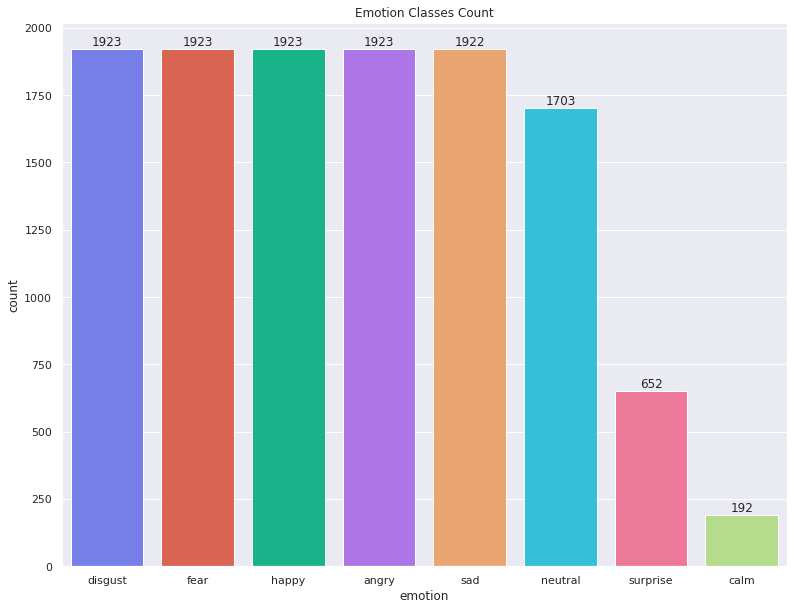

In [17]:
plt.figure(figsize = (13,10))
plt.title('Emotion Classes Count')
ax = sns.countplot(data = combined_df, x = 'emotion', order = combined_df['emotion'].value_counts().index, palette = ['#636efa', '#ef553b', '#00cc96', '#ab63fa', '#ffa15a', '#19d3f3', '#ff6692', '#b5e87f'])
ax.bar_label(ax.containers[0])

plt.show()


In [18]:
fig = px.bar(data_frame = combined_df,
             x = combined_df['emotion'].value_counts().index,
             y = combined_df['emotion'].value_counts(),
             color = combined_df['emotion'].value_counts().index,
             labels={'x':'emotion', 'y':'count'},
             title = 'Emotion Classes Count')

fig.show()


In [19]:
combined_df['emotion'].value_counts()

labels = combined_df['emotion'].value_counts().index
values = combined_df['emotion'].value_counts().values
colors=['#636efa', '#ef553b', '#00cc96', '#ab63fa', '#ffa15a', '#19d3f3', '#ff6692', '#b5e87f']

fig = go.Figure(data=[go.Pie(labels = labels, values = values, textinfo = 'label+percent',
                             insidetextorientation = 'radial',marker = dict(colors = colors))])

fig.update_layout(title='Emotion Classes Counts')
fig.show()


## 1.14 Bar Graph and Pie Chart of the Unique Genders


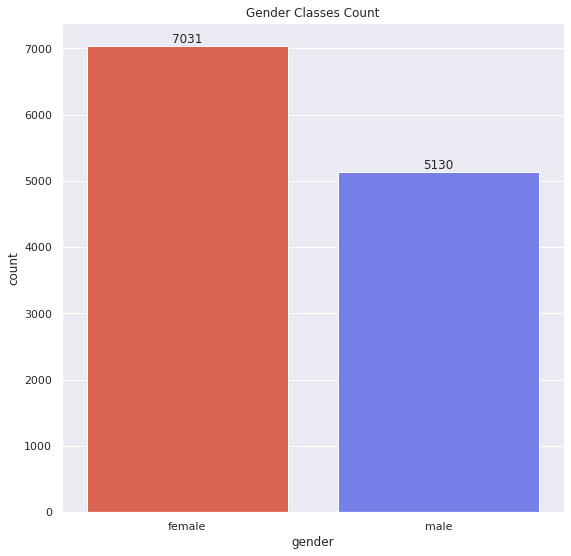

In [20]:
plt.figure(figsize = (9,9))
plt.title('Gender Classes Count')
genders = sns.countplot(x = 'gender',data = combined_df)
genders.set_xticklabels(genders.get_xticklabels())
ax = sns.countplot(x = 'gender', data = combined_df, palette = ['#ef553b', '#636efa'])
ax.bar_label(ax.containers[0])
plt.show()


In [21]:
fig = px.bar(data_frame = combined_df,
             x = combined_df['gender'].value_counts().index,
             y = combined_df['gender'].value_counts(),
             color = combined_df['gender'].value_counts().index,
             color_discrete_map = {
                 'female': '#ef553b',
                 'male': '#636efa'
             },
             labels={'x':'gender', 'y':'count'},
             title = 'Gender Classes Count',
             width = 700,
             height = 700)

fig.show()


In [22]:
combined_df['gender'].value_counts()

labels = combined_df['gender'].value_counts().index
values = combined_df['gender'].value_counts().values
colors = ['#ef553b', '#636efa']

fig = go.Figure(data = [go.Pie(labels = labels, values = values, textinfo = 'label+percent',
                             insidetextorientation = 'radial',marker = dict(colors = colors))])
fig.update_layout(title = 'Gender Classes Counts')
fig.show()


## 1.15 Set Color For Each Emotion


In [23]:
emotion_colors = {'surprise':'#ff6692',
                'neutral':'#19d3f3',
                'disgust':'#636efa',
                'fear':'#ef553b',
                'sad':'#ffa15a',
                'calm':'#b5e87f',
                'happy':'#00cc96',
                'angry':'#ab63fa'}


## 1.16 Wave Plot For Each Emotion


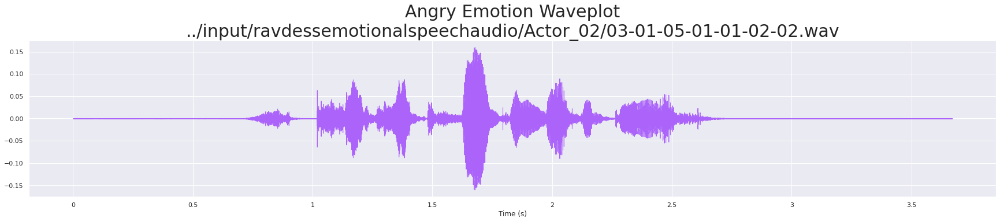

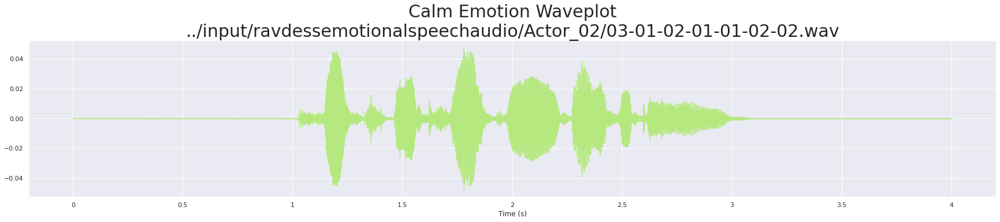

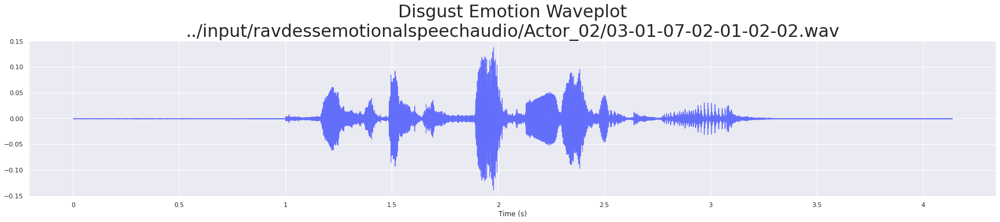

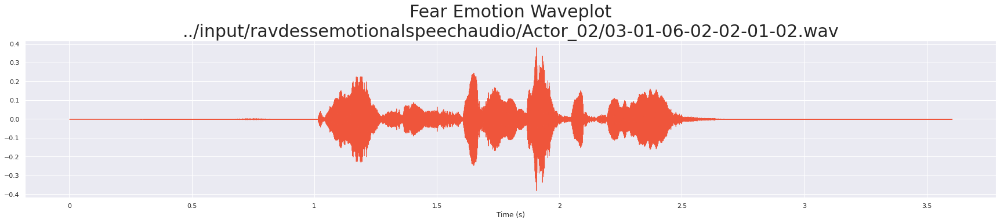

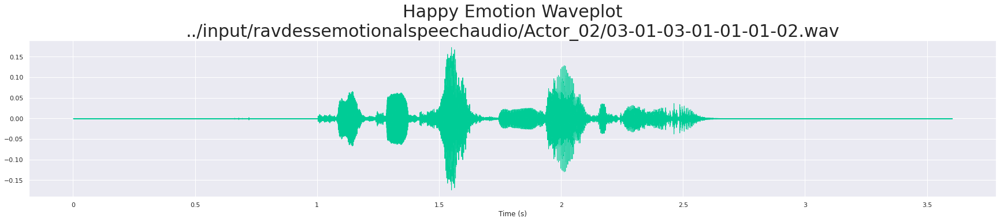

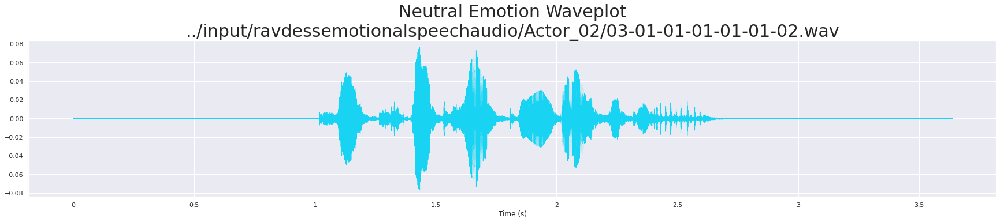

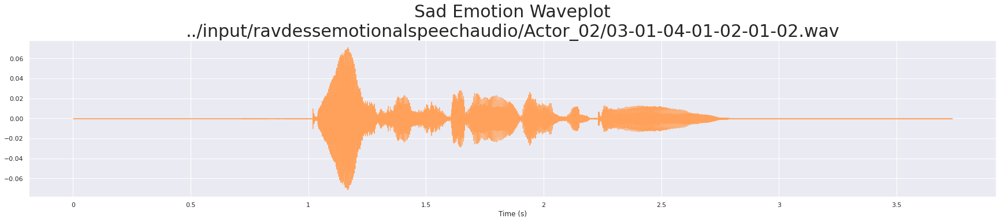

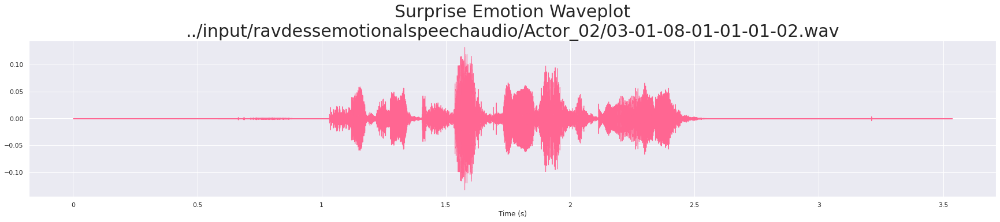

In [24]:
def wave_plot(audio_time_series, sampling_rate, emotion_class, emotion_color, file_path):
    plt.figure(figsize = (30, 5))
    librosa.display.waveshow(y = audio_time_series,sr = sampling_rate,color = emotion_color, x_axis = 's')
    plt.title(f'{emotion_class.capitalize()} Emotion Waveplot\n{file_path}', size = 30)


audio_path=[]
for emotion_class in emotions_classes:
    file_path = np.array(combined_df['location'][combined_df['emotion'] == emotion_class])[0]
    audio_time_series,sampling_rate = librosa.load(file_path)
    wave_plot(audio_time_series, sampling_rate, emotion_class, emotion_colors[emotion_class], file_path)


## 1.17 Spectogram For Each Emotion


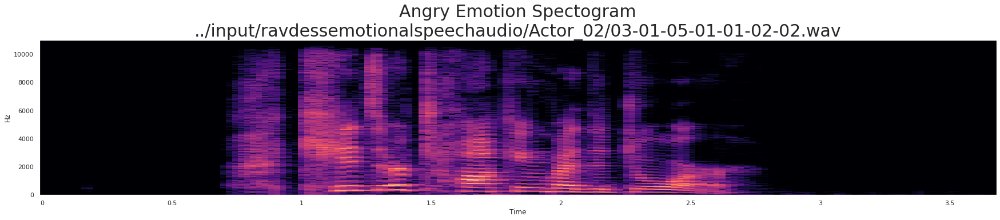

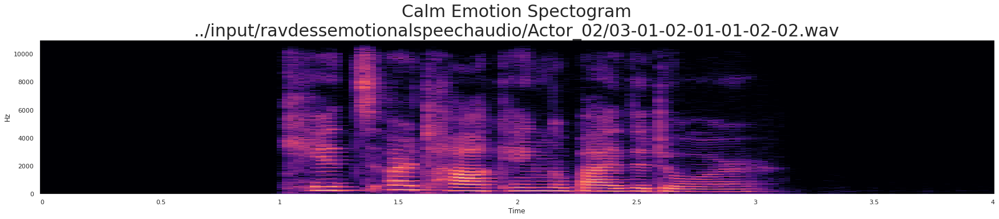

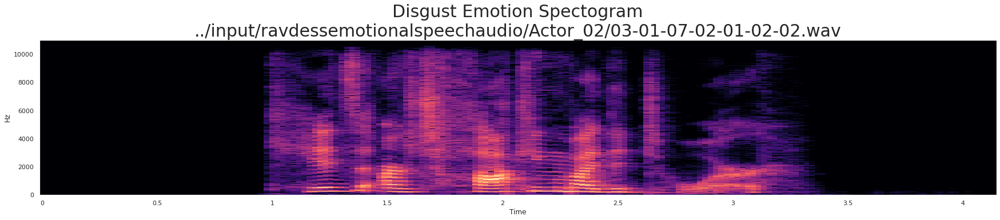

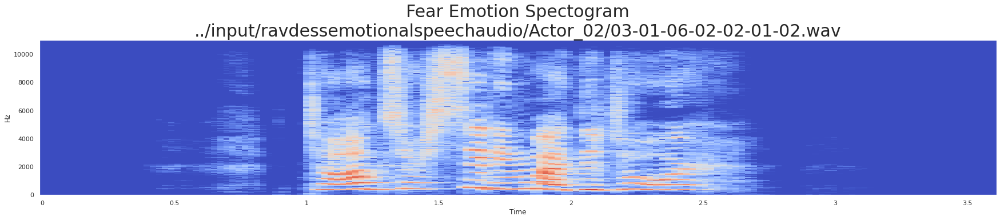

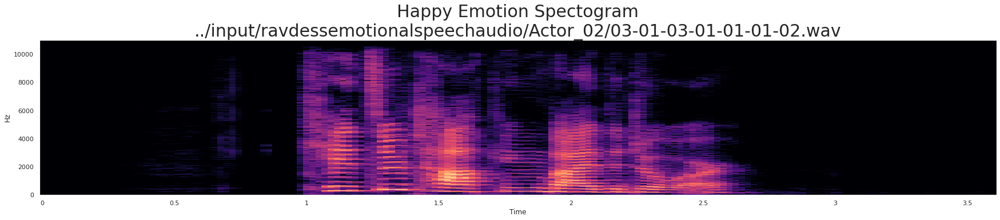

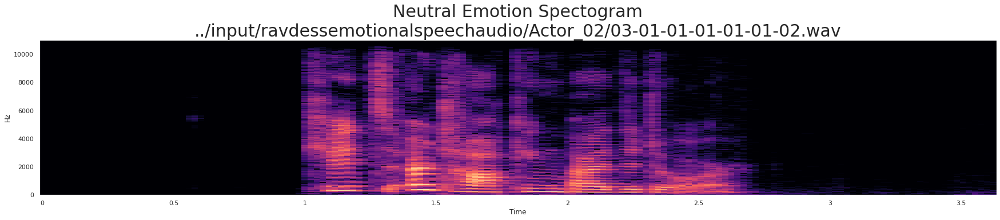

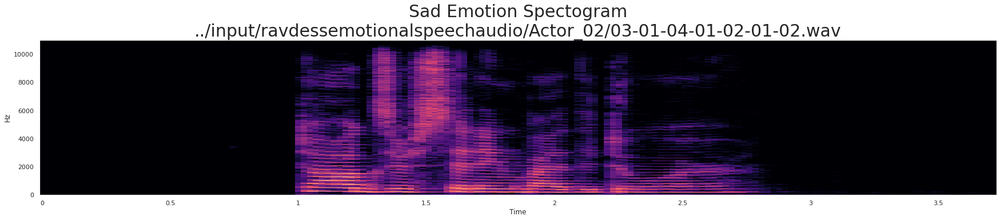

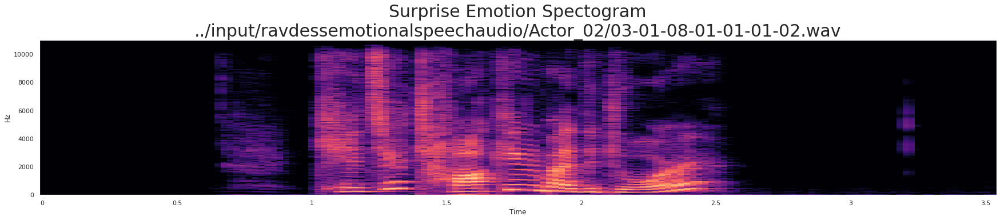

In [25]:
def spectogram(audio_time_series, sampling_rate, emotion_class, file_path):
    audio = librosa.stft(audio_time_series)
    audio_db = librosa.amplitude_to_db(abs(audio))
    plt.figure(figsize = (30,5))
    plt.title(f'{emotion_class.capitalize()} Emotion Spectogram\n{file_path}',size = 30)
    librosa.display.specshow(audio_db, sr = sampling_rate, x_axis = 'time', y_axis = 'hz')


audio_path=[]
for emotion_class in emotions_classes:
    file_path = np.array(combined_df['location'][combined_df['emotion'] == emotion_class])[0]
    audio_time_series, sampling_rate = librosa.load(file_path)
    spectogram(audio_time_series, sampling_rate, emotion_class, file_path)


## 1.18 Mel Spectogram For Each Emotion


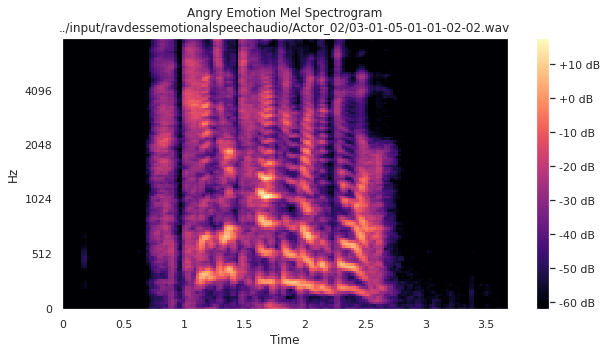

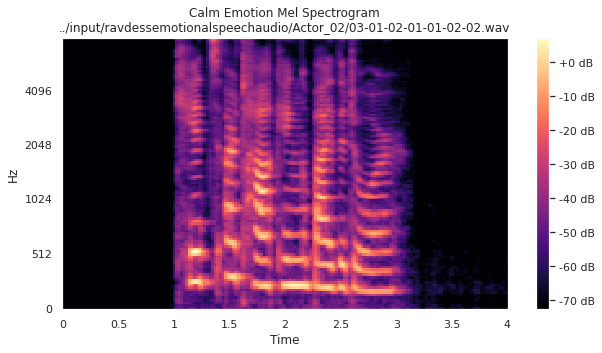

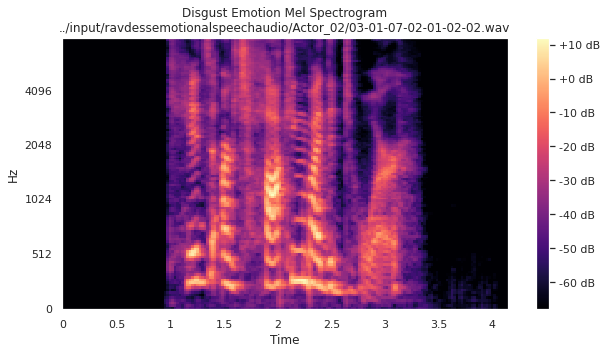

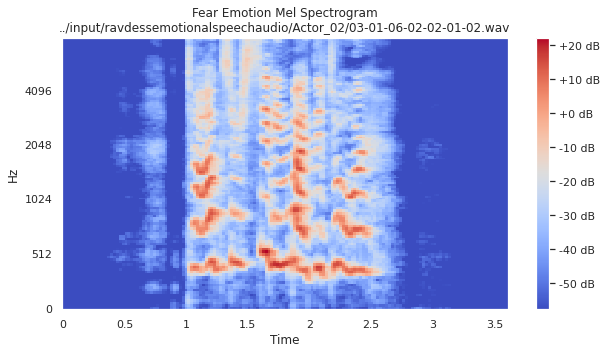

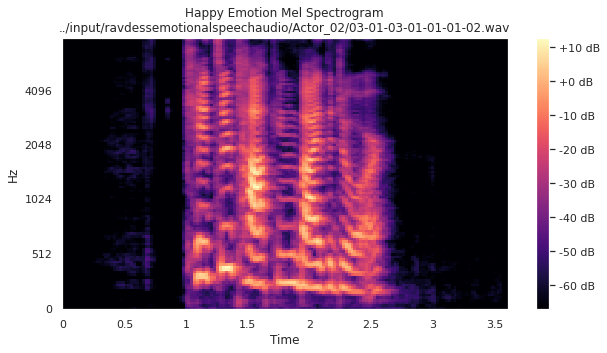

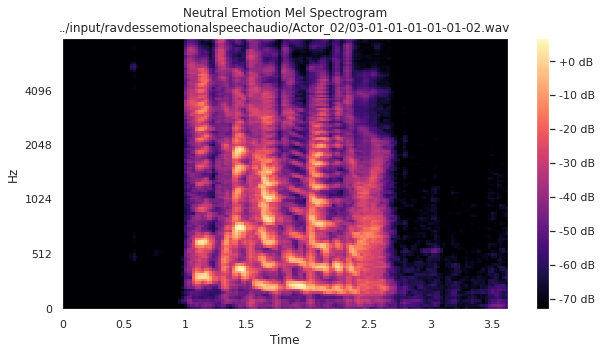

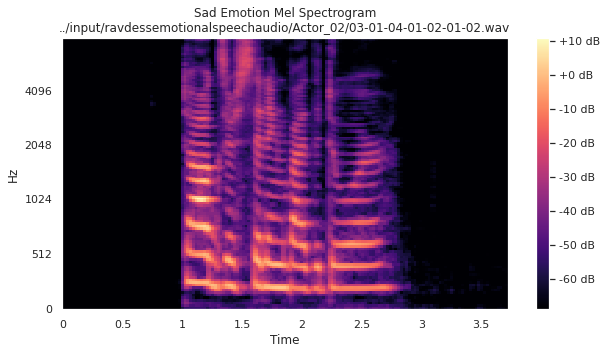

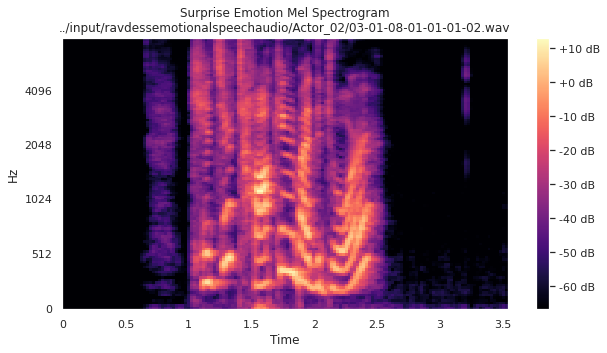

In [26]:
def mel_spectogram(audio_time_series, sampling_rate, emotion_class, file_path):
    spectrogram = librosa.feature.melspectrogram(y = audio_time_series, sr = sampling_rate, n_mels = 128,fmax = 8000) 
    spectrogram = librosa.power_to_db(spectrogram)
    plt.figure(figsize = (10, 5))
    plt.title(f'{emotion_class.capitalize()} Emotion Mel Spectrogram\n{file_path}')
    librosa.display.specshow(spectrogram, fmax = 8000, x_axis = 'time',y_axis = 'mel')
    plt.colorbar(format = '%+2.0f dB')


audio_path = []
for emotion_class in emotions_classes:
    file_path = np.array(combined_df['location'][combined_df['emotion'] == emotion_class])[0]
    audio_time_series, sampling_rate = librosa.load(file_path)
    mel_spectogram(audio_time_series, sampling_rate, emotion_class, file_path)
    audio_path.append(file_path)


## 1.19 Play the Sound File For Each of the Emotions Above to Make Sure Sound Files are Valid and Match the Waveform, Spectogram, and Mel Spectrogram Above.


In [27]:
print('emotions_classes =', emotions_classes,'\n')

for i in range(len(emotions_classes) - 1):
        print(emotions_classes[i].capitalize(), 'Audio Sample\n')
        print(audio_path[i])
        IPython.display.display(IPython.display.Audio(data = audio_path[i]))


emotions_classes = ['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise'] 

Angry Audio Sample

../input/ravdessemotionalspeechaudio/Actor_02/03-01-05-01-01-02-02.wav


Calm Audio Sample

../input/ravdessemotionalspeechaudio/Actor_02/03-01-02-01-01-02-02.wav


Disgust Audio Sample

../input/ravdessemotionalspeechaudio/Actor_02/03-01-07-02-01-02-02.wav


Fear Audio Sample

../input/ravdessemotionalspeechaudio/Actor_02/03-01-06-02-02-01-02.wav


Happy Audio Sample

../input/ravdessemotionalspeechaudio/Actor_02/03-01-03-01-01-01-02.wav


Neutral Audio Sample

../input/ravdessemotionalspeechaudio/Actor_02/03-01-01-01-01-01-02.wav


Sad Audio Sample

../input/ravdessemotionalspeechaudio/Actor_02/03-01-04-01-02-01-02.wav


___
## #2 Select and Engineer Features


## 2.1 Audio Data Augmentation
> 1. Noise Injection
> 2. Pitching
> 3. Stretching


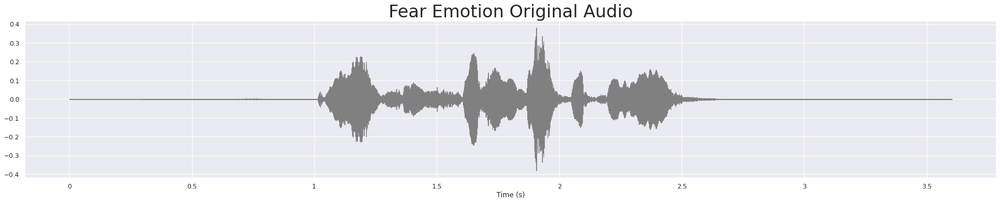

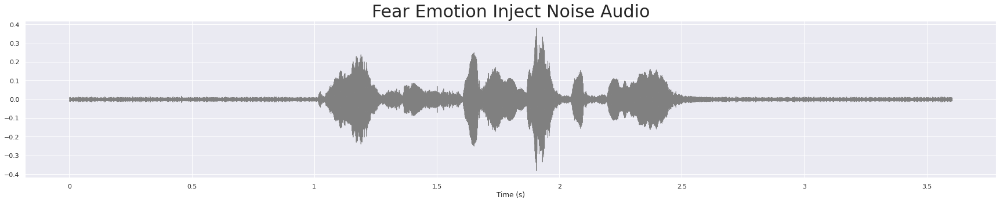

In [28]:
# Noise Injection.
def inject_noise(data, sampling_rate = 0.035, threshold = 0.075, random = False):
    if random:
        sampling_rate = np.random.random() * threshold
    noise_amplitude = sampling_rate * np.random.uniform() * np.amax(data)
    augmented_data = data + noise_amplitude * np.random.normal(size = data.shape[0])
    return augmented_data


# Test audio file (fear emotion).
data, sampling_rate = librosa.load(path = audio_path[3])

IPython.display.display(IPython.display.Audio(data = audio_path[3]))

plt.figure(figsize = (30,5))
librosa.display.waveshow(y = data, sr = sampling_rate, color = '#808080', x_axis = 's')
plt.title('Fear Emotion Original Audio', size = 30)

noise_audio = inject_noise(data)
plt.figure(figsize = (30,5))
librosa.display.waveshow(y = noise_audio, sr = sampling_rate, color = '#808080', x_axis = 's')
plt.title('Fear Emotion Inject Noise Audio', size = 30)
plt.show()
IPython.display.display(IPython.display.Audio(data = noise_audio, rate = sampling_rate))


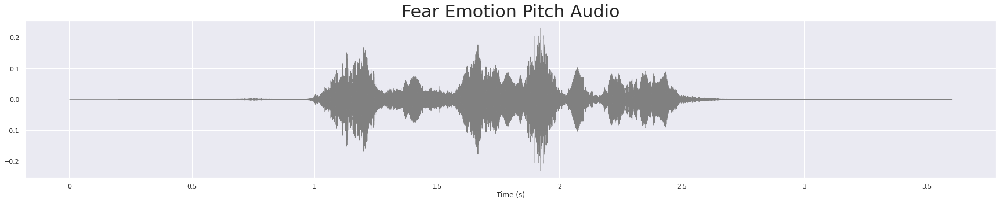

In [29]:
# Pitching.
def pitching(data, sampling_rate, pitch_factor = 0.7,random = False):
    if random:
        pitch_factor= np.random.random() * pitch_factor
    return librosa.effects.pitch_shift(y = data, sr = sampling_rate, n_steps = pitch_factor)


# Test audio file (fear emotion).
pitch_audio = pitching(data, sampling_rate)
plt.figure(figsize = (30,5))
librosa.display.waveshow(y = pitch_audio, sr = sampling_rate, color = '#808080', x_axis = 's')
plt.title('Fear Emotion Pitch Audio', size = 30)
plt.show()
IPython.display.display(IPython.display.Audio(data = pitch_audio, rate = sampling_rate))


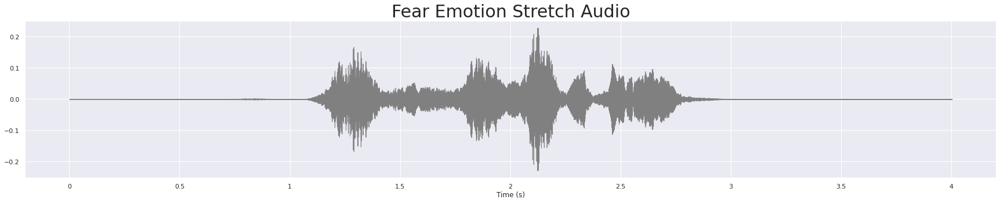

In [30]:
# Stretching.
def stretching(data,r = 0.9):
    return librosa.effects.time_stretch(y = data, rate = r)


# Test audio file (fear emotion).
stretch_audio = stretching(data)
plt.figure(figsize = (30,5))
librosa.display.waveshow(y = stretch_audio, sr = sampling_rate, color = '#808080', x_axis = 's')
plt.title('Fear Emotion Stretch Audio', size = 30)
plt.show()
IPython.display.display(IPython.display.Audio(data = stretch_audio, rate = sampling_rate))


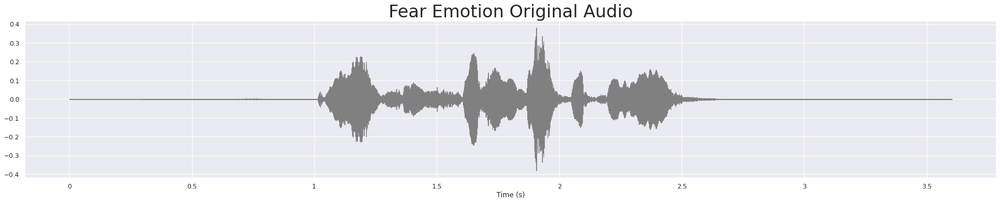

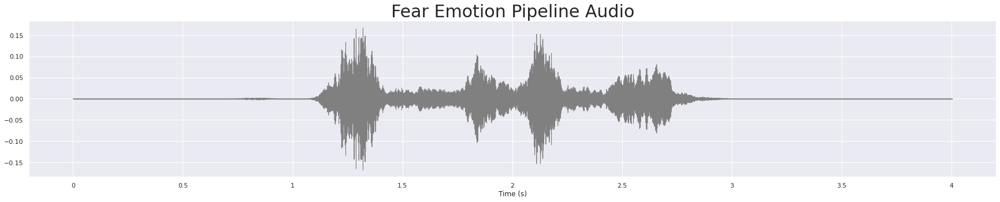

In [31]:
# Pipeline function that applies all the audio data augmentation functions we just built.
def pipeline(data, sampling_rate):
    data = pitching(data, sampling_rate, random = True)
    data = inject_noise(data, random = True)
    data = stretching(data)
    return data


# Test audio file (fear emotion).
data, sampling_rate = librosa.load(path = audio_path[3])

IPython.display.display(IPython.display.Audio(data = audio_path[3]))

plt.figure(figsize = (30,5))
librosa.display.waveshow(y = data, sr = sampling_rate, color = '#808080', x_axis = 's')
plt.title('Fear Emotion Original Audio', size = 30)

pipeline_audio = pipeline(data, sampling_rate)
plt.figure(figsize = (30,5))
librosa.display.waveshow(y = pipeline_audio, sr = sampling_rate, color = '#808080', x_axis = 's')
plt.title('Fear Emotion Pipeline Audio', size = 30)
plt.show()
IPython.display.display(IPython.display.Audio(data = pipeline_audio, rate = sampling_rate))


## 2.2 Audio Data Feature Extraction
> 1. **Zero Crossing Rate:** The rate of sign-changes of the signal during the duration of a particular frame.
> 2. **Root Mean Square:**  Metering tool that measures the average loudness of an audio track within a window of roughly 300 milliseconds.
> 3. **Mel Frequency Cepstral Coefficients:** Form a cepstral representation where the frequency bands are not linear but distributed according to the mel-scale.
> 4. **Chromagram:** Represents the 12 different pitches under an audio file, in one place so that we can understand the classification of the pitches in the audio files.
> 5. **Melspectrogram:** Scale of pitches that can be felt by the listener to be equal in distance from one another.
> 6. **Spectral Centroid:** The center of gravity of the spectrum.
> 7. **Spectral Bandwidth:** The difference between the upper and lower frequencies in a continuous band of frequencies.
> 8. **Spectral Rolloff:** The frequency below which 90% of the magnitude distribution of the spectrum is concentrated.
> 9. **Spectral Entropy:** Entropy of the normalized spectral energies for a set of sub-frames.
> 10. **Spectral Flux:** The squared difference between the normalized magnitudes of the spectra of the two successive frames.

***NOTE: Due to memory limitation, we will only do Mel Frequency Cepstral Coefficients, Root Mean Square, and Zero Crossing Rate.***


In [32]:
def zero_crossing_rate(data, frame_length, hop_length):
    zcr = librosa.feature.zero_crossing_rate(y = data, frame_length = frame_length, hop_length = hop_length)
    return np.squeeze(zcr)

def root_mean_square(data, frame_length = 2048, hop_length = 512):
    rms = librosa.feature.rms(y = data, frame_length = frame_length, hop_length = hop_length)
    return np.squeeze(rms)


def mel_frequency_cepstral_coefficients(data, sampling_rate, frame_length = 2048, hop_length = 512, flatten:bool = True):
    mfcc = librosa.feature.mfcc(y = data,sr = sampling_rate)
    return np.squeeze(mfcc.T) if not flatten else np.ravel(mfcc.T)


def chroma_stft(data, sampling_rate, frame_length = 2048, hop_length = 512, flatten: bool = True):
    short_time_fourier_transform = np.abs(librosa.stft(data))
    chroma = librosa.feature.chroma_stft(sr = sampling_rate, S = short_time_fourier_transform)
    return np.squeeze(chroma.T) if not flatten else np.ravel(chroma.T)


def melspectrogram(data, sampling_rate, frame_length = 2048, hop_length = 512, flatten: bool = True):
    melspect = librosa.feature.melspectrogram(y = data, sr = sampling_rate)
    return np.squeeze(melspect.T) if not flatten else np.ravel(melspect.T)


def spectral_centroid(data, sampling_rate, frame_length = 2048, hop_length = 512):
    scentroid = librosa.feature.spectral_centroid(y = data, sr = sampling_rate, n_fft = frame_length, hop_length = hop_length)
    return np.squeeze(scentroid)


def spectral_bandwidth(data, sampling_rate, frame_length = 2048, hop_length = 512):
    sbandwidth = librosa.feature.spectral_bandwidth(y = data, sr = sampling_rate, n_fft = frame_length, hop_length = hop_length)
    return np.squeeze(sbandwidth)


def spectral_rolloff(data, sampling_rate, frame_length = 2048, hop_length = 512):
    srolloff = librosa.feature.spectral_rolloff(y = data, sr = sampling_rate, n_fft = frame_length, hop_length = hop_length)
    return np.squeeze(srolloff)


def spectral_entropyy(data, sampling_rate):
    sentropy = spectral_entropy(x = data, sf = sampling_rate)
    return np.squeeze(sentropy)


def spectral_flux(data, sampling_rate):
    sflux = librosa.onset.onset_strength(y = data, sr = sampling_rate)
    return np.squeeze(sflux)



In [33]:
def feature_extraction(data, sampling_rate, frame_length = 2048, hop_length = 512):
    result = np.array([])
    result = np.hstack((result,
                        zero_crossing_rate(data, frame_length, hop_length),
                        root_mean_square(data, frame_length, hop_length),
                        mel_frequency_cepstral_coefficients(data, sampling_rate, frame_length, hop_length),
#                         chroma_stft(data, sampling_rate, frame_length, hop_length),
#                         melspectrogram(data, sampling_rate, frame_length, hop_length),
#                         spectral_centroid(data, sampling_rate, frame_length, hop_length),
#                         spectral_bandwidth(data, sampling_rate, frame_length, hop_length),
#                         spectral_rolloff(data, sampling_rate, frame_length, hop_length),
#                         spectral_entropyy(data, sampling_rate),
#                         spectral_flux(data, sampling_rate)
                     ))
    return result


### Four Times More Rows Than The Original/Initial Dataset Because For Each Audio File We Now Have Four Rows Representing:
> 1. No Audio Data Augmentation             (first row)
> 2. Inject Noise                           (second row)
> 3. Pitching                               (third row)
> 4. Stretching                             (fourth row)
> 5. Pitching and Inject Noise              (fifth row)
> 6. Stretching and Pitching                (sixth row)
> 7. Pitching, Inject Noise, and Stretching (seventh row)

***NOTE: Due to memory limitation, we will only do No Audio Data Augmentation, Inject Noise, Pitching, and  Pitching and Inject Noise.***


In [34]:
# Duration and offset act as placeholders because there is no audio in start and the ending of each audio file is noramlly below three seconds.
def get_features(file_path, duration = 2.5, offset = 0.6):
    data, sampling_rate = librosa.load(path = file_path, duration = duration, offset = offset)
    
    # No audio data augmentation.
    audio_1 = feature_extraction(data, sampling_rate)
#     audio_1.resize((1, 19921))
    audio = np.array(audio_1)

    # Inject Noise.
    noise_audio_1 = inject_noise(data, random = True)
    audio_2 =  feature_extraction(noise_audio_1, sampling_rate)
#     audio_2.resize((1, 19921))
    audio = np.vstack((audio, audio_2))
    
    # Pitching.
    pitch_audio_1 = pitching(data, sampling_rate, random = True)
    audio_3 = feature_extraction(pitch_audio_1, sampling_rate)
#     audio_3.resize((1, 19921))
    audio = np.vstack((audio, audio_3))
    
#     # Stretching.
#     stretch_audio_1 = stretching(data)
#     audio_4 = feature_extraction(stretch_audio_1, sampling_rate)
#     audio_4.resize((1, 19921))
#     audio = np.vstack((audio, audio_4))
    
    # Pitching and Inject Noise.
    pitch_audio_2 = pitching(data, sampling_rate, random = True)
    pitch_noise_audio_1 = inject_noise(pitch_audio_2, random = True)
    audio_5 = feature_extraction(pitch_noise_audio_1, sampling_rate)
#     audio_5.resize((1, 19921))
    audio = np.vstack((audio, audio_5))
    
#     # Stretching and Pitching.
#     stretch_audio_2 = stretching(data)
#     stretch_pitch_audio_1 = pitching(stretch_audio_2, sampling_rate, random = True)
#     audio_6 = feature_extraction(stretch_pitch_audio_1, sampling_rate)
#     audio_6.resize((1, 19921))
#     audio = np.vstack((audio, audio_6))
    
#     # Pitching, Inject Noise, and Stretching.
#     pitch_noise_stretch_audio_1 = pipeline(data, sampling_rate)
#     audio_7 =  feature_extraction(pitch_noise_stretch_audio_1, sampling_rate)
#     audio_7.resize((1, 19921))
#     audio = np.vstack((audio, audio_7))
    
    audio_features = audio

    return audio_features


## 2.3 Extract Audio Data Features From Each Audio File


In [35]:
audio_features_list = []
genders_list = []
emotions_list = []
locations_list = []

print('Audio Data - Features Extraction Starts')

for gender, emotion, file_path, index in zip(combined_df.gender, combined_df.emotion, combined_df.location, tqdm(range(combined_df.location.shape[0]))):
    audio_features = get_features(file_path)    
    
    if index % 1 == 0:
        print(index, ' audio files have been feature extracted(', round(index / 12162 * 100), '%)\r', sep = '', end = '')
    
    for i in audio_features:
        audio_features_list.append(i)
        genders_list.append(gender)
        emotions_list.append(emotion)
        locations_list.append(file_path)

print('\nAudio Data - Features Extraction Ends')


Audio Data - Features Extraction Starts


  0%|          | 0/12161 [00:00<?, ?it/s]

12160 audio files have been feature extracted(100%)
Audio Data - Features Extraction Ends


## 2.4 Convert the Audio Data Features From Each Audio File to a Dataframe


In [36]:
audio_features_tuple = tuple(audio_features_list)

audio_features_df = pd.DataFrame(audio_features_tuple)

audio_features_df['gender'] = genders_list
audio_features_df['emotion'] = emotions_list
audio_features_df['location'] = locations_list


In [37]:
print('audio_features_df.shape =', audio_features_df.shape, '\n')

audio_features_df


audio_features_df.shape = (48644, 2379) 



,0,1,2,3,4,5,6,7,8,9,...,2369,2370,2371,2372,2373,2374,2375,gender,emotion,location
0,0.331543,0.471680,0.564941,0.452148,0.374512,0.296875,0.265137,0.256348,0.252441,0.251953,...,-1.599245,-1.234544,-0.693115,-0.038821,0.675410,1.405862,2.112551,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
1,0.248535,0.375977,0.484375,0.483398,0.437988,0.400879,0.373535,0.335938,0.340332,0.333496,...,1.791099,-3.305234,-2.792845,0.411993,1.027858,-0.812382,3.938427,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
2,0.297852,0.413086,0.519043,0.449707,0.373047,0.322754,0.278320,0.260742,0.253906,0.252441,...,1.210398,1.342063,1.567144,1.852556,2.169065,2.492085,2.800848,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
3,0.239746,0.360840,0.482422,0.491211,0.489258,0.494141,0.485352,0.479980,0.481445,0.466797,...,1.053595,0.311482,3.867261,1.538312,0.066576,-3.575587,-2.633961,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
4,0.400879,0.591309,0.783203,0.777832,0.771973,0.777832,0.771973,0.775391,0.758789,0.580078,...,2.223155,0.986784,-0.730886,-2.531058,-4.002848,-4.849192,-4.929412,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48639,0.022461,0.032715,0.047852,0.045898,0.047852,0.059570,0.073730,0.093262,0.103516,0.098633,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
48640,0.042480,0.059570,0.069336,0.058594,0.038086,0.026367,0.027344,0.031250,0.037109,0.041992,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
48641,0.042480,0.060547,0.070312,0.059570,0.039062,0.026367,0.027344,0.031250,0.037109,0.041992,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
48642,0.048828,0.067383,0.077148,0.067383,0.043945,0.033691,0.034180,0.035156,0.041504,0.043945,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...


## 2.5 Convert the Audio Data Features From Each Audio File to a .parquet File For Future Reference so that we Can Load it Without Doing the Feature Extraction Again


In [38]:
!pip install fastparquet

audio_features_df_parquet = audio_features_df
audio_features_df_parquet.columns = audio_features_df_parquet.columns.astype(str)
audio_features_df_parquet.to_parquet('audio_features.parquet', engine = 'fastparquet')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 4.8 MB/s eta 0:00:00a 0:00:010m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 25.0 MB/s eta 0:00:0000:0100:01


In [39]:
# # This is used to load the .parquet file into the audio_features_df whenever necessary.
# !pip install fastparquet
# # File path to .parquet.
# file_path_parquet = './audio_features.parquet'

# audio_features_df = pd.read_parquet(file_path_parquet)


## 2.6 Inspect / Replace NULL Values


In [40]:
print('audio_features_df.shape =', audio_features_df.shape, '\n')
print(audio_features_df.isnull().sum(), '\n')
print('audio_features_df.isnull().sum().sum() = ', audio_features_df.isnull().sum().sum())

print('audio_features_df.shape =', audio_features_df.shape, '\n')
print('audio_features_df.isna().sum().sum() =', audio_features_df.isna().sum().sum(), '\n')
print(audio_features_df.isna().any())
print()
audio_features_df.isnull().sum(axis = 0)

print('Replacing NaN values with 0.\n')
audio_features_df = audio_features_df.fillna(0)

print('audio_features_df.shape =', audio_features_df.shape, '\n')
print('audio_features_df.isna().sum().sum() =', audio_features_df.isna().sum().sum(), '\n')
print(audio_features_df.isna().any())
print()
audio_features_df.isnull().sum(axis = 0)


audio_features_df.shape = (48644, 2379) 

0               0
1               0
2               0
3               0
4               0
            ...  
2374        37620
2375        37620
gender          0
emotion         0
location        0
Length: 2379, dtype: int64 

audio_features_df.isnull().sum().sum() =  28243600
audio_features_df.shape = (48644, 2379) 

audio_features_df.isna().sum().sum() = 28243600 

0           False
1           False
2           False
3           False
4           False
            ...  
2374         True
2375         True
gender      False
emotion     False
location    False
Length: 2379, dtype: bool

Replacing NaN values with 0.

audio_features_df.shape = (48644, 2379) 

audio_features_df.isna().sum().sum() = 0 

0           False
1           False
2           False
3           False
4           False
            ...  
2374        False
2375        False
gender      False
emotion     False
location    False
Length: 2379, dtype: bool



0           0
1           0
2           0
3           0
4           0
           ..
2374        0
2375        0
gender      0
emotion     0
location    0
Length: 2379, dtype: int64

## 2.7 Inspect/ Remove Duplicate Rows

In [41]:
print('audio_features_df.duplicated().sum() = ', audio_features_df.duplicated().sum())

print('audio_features_df.shape =', audio_features_df.shape)

duplicates = audio_features_df[audio_features_df.duplicated()]

print('Duplicate Rows:')

duplicates


audio_features_df.duplicated().sum() =  0
audio_features_df.shape = (48644, 2379)
Duplicate Rows:


,0,1,2,3,4,5,6,7,8,9,...,2369,2370,2371,2372,2373,2374,2375,gender,emotion,location


In [42]:
print('audio_features_df.shape =', audio_features_df.shape)

audio_features_df = audio_features_df.drop_duplicates()

print('audio_features_df.duplicated().sum() =', audio_features_df.duplicated().sum())

print('audio_features_df.shape =', audio_features_df.shape)

audio_features_df


audio_features_df.shape = (48644, 2379)
audio_features_df.duplicated().sum() = 0
audio_features_df.shape = (48644, 2379)


,0,1,2,3,4,5,6,7,8,9,...,2369,2370,2371,2372,2373,2374,2375,gender,emotion,location
0,0.331543,0.471680,0.564941,0.452148,0.374512,0.296875,0.265137,0.256348,0.252441,0.251953,...,-1.599245,-1.234544,-0.693115,-0.038821,0.675410,1.405862,2.112551,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
1,0.248535,0.375977,0.484375,0.483398,0.437988,0.400879,0.373535,0.335938,0.340332,0.333496,...,1.791099,-3.305234,-2.792845,0.411993,1.027858,-0.812382,3.938427,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
2,0.297852,0.413086,0.519043,0.449707,0.373047,0.322754,0.278320,0.260742,0.253906,0.252441,...,1.210398,1.342063,1.567144,1.852556,2.169065,2.492085,2.800848,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
3,0.239746,0.360840,0.482422,0.491211,0.489258,0.494141,0.485352,0.479980,0.481445,0.466797,...,1.053595,0.311482,3.867261,1.538312,0.066576,-3.575587,-2.633961,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
4,0.400879,0.591309,0.783203,0.777832,0.771973,0.777832,0.771973,0.775391,0.758789,0.580078,...,2.223155,0.986784,-0.730886,-2.531058,-4.002848,-4.849192,-4.929412,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48639,0.022461,0.032715,0.047852,0.045898,0.047852,0.059570,0.073730,0.093262,0.103516,0.098633,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
48640,0.042480,0.059570,0.069336,0.058594,0.038086,0.026367,0.027344,0.031250,0.037109,0.041992,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
48641,0.042480,0.060547,0.070312,0.059570,0.039062,0.026367,0.027344,0.031250,0.037109,0.041992,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
48642,0.048828,0.067383,0.077148,0.067383,0.043945,0.033691,0.034180,0.035156,0.041504,0.043945,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...


## 2.8 Print Out the Number Examples in Each Class (aka the class balances)


In [43]:
audio_features_df.emotion.value_counts(), audio_features_df.emotion.value_counts(normalize = True)


(disgust     7692
 fear        7692
 happy       7692
 angry       7692
 sad         7688
 neutral     6812
 surprise    2608
 calm         768
 Name: emotion, dtype: int64,
 disgust     0.158128
 fear        0.158128
 happy       0.158128
 angry       0.158128
 sad         0.158046
 neutral     0.140038
 surprise    0.053614
 calm        0.015788
 Name: emotion, dtype: float64)

## 2.9 Print Out the Number of Unique Emotions


In [44]:
emotions_classes = sorted(audio_features_df['emotion'].unique())
print(emotions_classes)


['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']


## 2.10 Split Our Data Into Three Sets:
> 1. Training   (80%)
> 2. Validating (10%)
> 3. Testing    (10%)


In [45]:
X = audio_features_df.drop(labels = ['emotion', 'gender', 'location'], axis = 1)
y = audio_features_df['emotion']


In [46]:
X


,0,1,2,3,4,5,6,7,8,9,...,2366,2367,2368,2369,2370,2371,2372,2373,2374,2375
0,0.331543,0.471680,0.564941,0.452148,0.374512,0.296875,0.265137,0.256348,0.252441,0.251953,...,-0.948772,-1.517647,-1.716411,-1.599245,-1.234544,-0.693115,-0.038821,0.675410,1.405862,2.112551
1,0.248535,0.375977,0.484375,0.483398,0.437988,0.400879,0.373535,0.335938,0.340332,0.333496,...,-4.798822,-2.293008,1.941994,1.791099,-3.305234,-2.792845,0.411993,1.027858,-0.812382,3.938427
2,0.297852,0.413086,0.519043,0.449707,0.373047,0.322754,0.278320,0.260742,0.253906,0.252441,...,1.686816,1.357979,1.205859,1.210398,1.342063,1.567144,1.852556,2.169065,2.492085,2.800848
3,0.239746,0.360840,0.482422,0.491211,0.489258,0.494141,0.485352,0.479980,0.481445,0.466797,...,2.449974,0.490359,-0.091382,1.053595,0.311482,3.867261,1.538312,0.066576,-3.575587,-2.633961
4,0.400879,0.591309,0.783203,0.777832,0.771973,0.777832,0.771973,0.775391,0.758789,0.580078,...,2.004560,2.585884,2.746578,2.223155,0.986784,-0.730886,-2.531058,-4.002848,-4.849192,-4.929412
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48639,0.022461,0.032715,0.047852,0.045898,0.047852,0.059570,0.073730,0.093262,0.103516,0.098633,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
48640,0.042480,0.059570,0.069336,0.058594,0.038086,0.026367,0.027344,0.031250,0.037109,0.041992,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
48641,0.042480,0.060547,0.070312,0.059570,0.039062,0.026367,0.027344,0.031250,0.037109,0.041992,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
48642,0.048828,0.067383,0.077148,0.067383,0.043945,0.033691,0.034180,0.035156,0.041504,0.043945,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [47]:
y


0        surprise
1        surprise
2        surprise
3        surprise
4         neutral
           ...   
48639    surprise
48640    surprise
48641    surprise
48642    surprise
48643    surprise
Name: emotion, Length: 48644, dtype: object

In [48]:
X.to_parquet('X.parquet', engine = 'fastparquet')

# Convert y from a series to a dataframe to be able to store it in .parquet file format.
y = y.to_frame(name = 'Emotion')
y.to_parquet('y.parquet', engine = 'fastparquet')


In [49]:
# # This is used to load the .parquet files whenever necessary.
# !pip install fastparquet
# # Read the .parquet files.
# X = pd.read_parquet('X.parquet')
# y = pd.read_parquet('y.parquet')


In [50]:
label = LabelEncoder()

y = np_utils.to_categorical(label.fit_transform(y))

print(label.classes_)

y


['angry' 'calm' 'disgust' 'fear' 'happy' 'neutral' 'sad' 'surprise']


array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [51]:
X_train, X_remain, y_train, y_remain = train_test_split(
    X, y, test_size = 0.2, random_state = 42)

print('X_remain.shape = ', X_remain.shape)
print('y_remain.shape = ', y_remain.shape)

X_valid, X_test, y_valid, y_test = train_test_split(
    X_remain, y_remain, test_size = 0.5, random_state = 42)

print('X_train.shape  = ', X_train.shape)
print('y_train.shape  = ', y_train.shape)
print('X_valid.shape  = ', X_valid.shape)
print('y_valid.shape  = ', y_valid.shape)
print('X_test.shape   = ', X_test.shape)
print('y_test.shape   = ', y_test.shape)


X_remain.shape =  (9729, 2376)
y_remain.shape =  (9729, 8)
X_train.shape  =  (38915, 2376)
y_train.shape  =  (38915, 8)
X_valid.shape  =  (4864, 2376)
y_valid.shape  =  (4864, 8)
X_test.shape   =  (4865, 2376)
y_test.shape   =  (4865, 8)


In [52]:
# Standardize / Scale data.
# Standardize features by removing the mean and scaling to unit variance.
# z = (x - u) / s

standard_scaler = StandardScaler()
X_train = standard_scaler.fit_transform(X_train.values)
X_valid = standard_scaler.transform(X_valid.values)
X_test = standard_scaler.transform(X_test.values)

print('X_train.shape  = ', X_train.shape)
print('X_remain.shape = ', X_remain.shape)
print('X_valid.shape  = ', X_valid.shape)
print('X_test.shape   = ', X_test.shape)


X_train.shape  =  (38915, 2376)
X_remain.shape =  (9729, 2376)
X_valid.shape  =  (4864, 2376)
X_test.shape   =  (4865, 2376)


In [53]:
# Modify data to fit into a 1D-CNN.

X_train = np.expand_dims(X_train, axis = 2)
X_valid = np.expand_dims(X_valid, axis = 2)
X_test = np.expand_dims(X_test, axis = 2)

print('X_train.shape  = ', X_train.shape)
print('X_remain.shape = ', X_remain.shape)
print('X_valid.shape  = ', X_valid.shape)
print('X_test.shape   = ', X_test.shape)


X_train.shape  =  (38915, 2376, 1)
X_remain.shape =  (9729, 2376)
X_valid.shape  =  (4864, 2376, 1)
X_test.shape   =  (4865, 2376, 1)


In [54]:
print('X_train.shape', X_train.shape)
print('X_valid.shape', X_valid.shape)
print('X_test.shape', X_test.shape)

print('y_train.shape', y_train.shape)
print('y_valid.shape', y_valid.shape)
print('y_test.shape', y_test.shape)


X_train.shape (38915, 2376, 1)
X_valid.shape (4864, 2376, 1)
X_test.shape (4865, 2376, 1)
y_train.shape (38915, 8)
y_valid.shape (4864, 8)
y_test.shape (4865, 8)


____
## #3 Build and Train Model


## 3.1 Build / Define the Model


In [55]:
early_stopping = EarlyStopping(monitor = 'val_accuracy',
                               patience = 10,
                               mode = 'auto',
                               restore_best_weights = True)


In [56]:
reduce_learning_rate = ReduceLROnPlateau(monitor ='val_accuracy',
                                         factor = 0.5,
                                         verbose = 1,
                                         min_lr = 0.00001)


In [57]:
# Create the neural network.

model = models.Sequential()

model.add(layers.Conv1D(filters = 512, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu', input_shape = (X_train.shape[1], 1)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 512, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 512, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 512, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 256, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 256, kernel_size = 3, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 128, kernel_size = 3, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling1D(pool_size = 3, strides = 2, padding = 'same'))

model.add(layers.Flatten())

model.add(layers.Dense(units = 512, activation = 'relu'))

model.add(layers.BatchNormalization())

model.add(layers.Dense(units = 8, activation = 'softmax'))

model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics=['accuracy'])

print(model.summary())


2022-11-27 20:25:43.990333: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-11-27 20:25:43.993988: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-11-27 20:25:43.994684: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-11-27 20:25:43.995988: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 2376, 512)         3072      
_________________________________________________________________
batch_normalization (BatchNo (None, 2376, 512)         2048      
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 1188, 512)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 1188, 512)         1311232   
_________________________________________________________________
batch_normalization_1 (Batch (None, 1188, 512)         2048      
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 594, 512)          0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 594, 512)          1

## 3.3 Train the Model


In [58]:
history_callback_object = model.fit(x = X_train, y = y_train, batch_size = 64, epochs = 43, callbacks = [early_stopping, reduce_learning_rate], validation_data = (X_valid, y_valid))


2022-11-27 20:25:48.745513: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 369848160 exceeds 10% of free system memory.
2022-11-27 20:25:49.212700: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 369848160 exceeds 10% of free system memory.
2022-11-27 20:25:49.545476: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/43


2022-11-27 20:25:52.385810: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


609/609 [==============================] - ETA: 0s - loss: 1.4280 - accuracy: 0.4587

2022-11-27 20:28:03.639581: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 46227456 exceeds 10% of free system memory.
2022-11-27 20:28:03.707853: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 46227456 exceeds 10% of free system memory.


609/609 [==============================] - 140s 214ms/step - loss: 1.4280 - accuracy: 0.4587 - val_loss: 1.4160 - val_accuracy: 0.4527
Epoch 2/43
609/609 [==============================] - 128s 210ms/step - loss: 1.1268 - accuracy: 0.5666 - val_loss: 1.2369 - val_accuracy: 0.5275
Epoch 3/43
609/609 [==============================] - 128s 210ms/step - loss: 1.0367 - accuracy: 0.5998 - val_loss: 1.0533 - val_accuracy: 0.6092
Epoch 4/43
609/609 [==============================] - 129s 213ms/step - loss: 0.9344 - accuracy: 0.6416 - val_loss: 1.5715 - val_accuracy: 0.4669
Epoch 5/43
609/609 [==============================] - 128s 210ms/step - loss: 0.9633 - accuracy: 0.6308 - val_loss: 0.9314 - val_accuracy: 0.6571
Epoch 6/43
609/609 [==============================] - 129s 213ms/step - loss: 0.7811 - accuracy: 0.7028 - val_loss: 0.8077 - val_accuracy: 0.6943
Epoch 7/43
609/609 [==============================] - 129s 212ms/step - loss: 0.7075 - accuracy: 0.7308 - val_loss: 0.8928 - val_accura

## 3.4 Save the history_callback_object


In [59]:
file_path_history_callback_object = '/kaggle/working/trainHistoryDictionary'

with open(file_path_history_callback_object, 'wb') as history_callback_object_file:
    pickle.dump(history_callback_object.history, history_callback_object_file)

# This is used to load the history_callback_object whenever necessary.
# with open(file_path_history_callback_object, 'rb') as history_callback_object_file:
#     history_callback_object = pickle.load(history_callback_object_file)


## 3.5 Save the Model


In [60]:
file_path_model = './model.h5'

model.save(file_path_model)


# This is used to load the model whenever necessary.
#file_path_model = '../input/veractpmodel/model.h5'

#model = load_model(file_path_model)


___
## #4 Evaluate Model


## 4.1 Model Loss Graph

### ***NOTE: Remove the .history  after the history_callback_object if you load the history_callback_object from an already existing file. This implies for the two graphs below.***


In [61]:
fig = px.line(data_frame = history_callback_object.history,
              y = ['loss', 'val_loss'],
              labels = {'index':'Epoch', 'value':'Loss'},
              title = 'Loss vs Epoch')
fig.show()

history_callback_object.history.keys()


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])

## 4.2 Model Accuracy Graph


In [62]:
fig = px.line(data_frame = history_callback_object.history,
              y = ['accuracy', 'val_accuracy'],
              labels = {'index':'Epoch', 'value':'Accuracy'},
              title = 'Accuracy vs Epoch')
fig.show()

history_callback_object.history.keys()


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])

## 4.3 Side to Side Model Loss and Accuracy Graphs


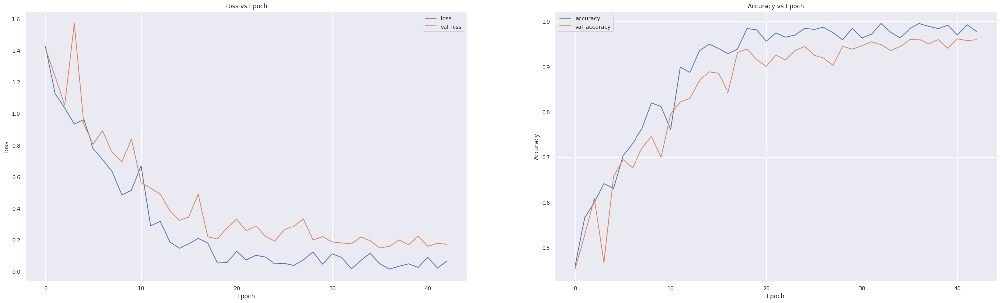

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])

In [63]:
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.plot(history_callback_object.history['loss'], label = 'loss')
ax1.plot(history_callback_object.history['val_loss'], label = 'val_loss')
ax1.legend()
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Loss vs Epoch')
ax1.grid(True)

ax2.plot(history_callback_object.history['accuracy'], label = 'accuracy')
ax2.plot(history_callback_object.history['val_accuracy'], label = 'val_accuracy')
ax2.legend()
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.set_title('Accuracy vs Epoch')
ax2.grid(True)

fig.set_figheight(10)
fig.set_figwidth(35)
plt.show()

history_callback_object.history.keys()


## 4.4 Make and Evaluate New Predictions Using Our Testing Data


In [64]:
# y_pred stores the probabilities for each emotion. The highest probability corresponds to the predicted emotion.
y_pred = model.predict(X_test)
print(y_pred[0])
y_pred


2022-11-27 21:58:14.657579: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 46236960 exceeds 10% of free system memory.


[5.3525855e-06 7.0702455e-10 1.3830256e-05 5.1757961e-08 9.9821067e-01
 1.7700954e-03 4.8685460e-09 3.7431267e-08]


array([[5.3525855e-06, 7.0702455e-10, 1.3830256e-05, ..., 1.7700954e-03,
        4.8685460e-09, 3.7431267e-08],
       [1.2598191e-04, 2.7573957e-08, 6.1245996e-01, ..., 4.2941474e-06,
        1.9848195e-03, 3.3254750e-09],
       [8.8178587e-10, 4.5842223e-12, 6.3871537e-13, ..., 6.3722450e-10,
        5.9291619e-06, 1.1987338e-07],
       ...,
       [8.2845236e-10, 2.6750647e-11, 9.8170949e-06, ..., 1.4387758e-09,
        9.9998569e-01, 5.6678773e-15],
       [6.9487911e-08, 2.3971222e-12, 2.9262385e-06, ..., 5.6647292e-10,
        9.9998844e-01, 6.9222602e-14],
       [7.5206095e-05, 5.3350085e-12, 3.9727430e-11, ..., 2.2200219e-11,
        2.2359828e-04, 9.9927467e-01]], dtype=float32)

In [65]:
y_pred = np.argmax(y_pred, axis = 1)
print(y_pred[0])
y_pred


4


array([4, 2, 4, ..., 6, 6, 7])

In [66]:
y_check = np.argmax(y_test, axis = 1)
print(y_check[0])
y_check


4


array([4, 3, 4, ..., 6, 6, 7])

In [67]:
print('Accuracy of model on test data: ', model.evaluate(X_test, y_test)[1] * 100 , '%', sep = '')


153/153 [==============================] - 5s 30ms/step - loss: 0.1692 - accuracy: 0.9591
Accuracy of model on test data: 95.90955972671509%


In [68]:
model_loss, model_accuracy = model.evaluate(X_test, y_test)

print('Model Test Loss: %f' % (model_loss))
print('Model Test Loss: %f' % (model_loss * 100), '%\n', sep = '')
print('Model Test Accuracy: %f' % (model_accuracy))
print('Model Test Accuracy: %f' % (model_accuracy * 100), '%', sep = '')


153/153 [==============================] - 5s 30ms/step - loss: 0.1692 - accuracy: 0.9591
Model Test Loss: 0.169217
Model Test Loss: 16.921656%

Model Test Accuracy: 0.959096
Model Test Accuracy: 95.909560%


In [69]:
# Calculate our accuracy score.
accuracy = accuracy_score(y_check, y_pred)

# Calculate our precision score.
precision = precision_score(y_check, y_pred, average = 'micro')

# Calculate our recall score.
recall = recall_score(y_check, y_pred, average = 'micro')

# Calculate our f1-score.
f1 = f1_score(y_check, y_pred, average = 'micro')

# Print each of our scores to inspect performance.
print('Accuracy Score: %f' % (accuracy * 100), '%', sep = '')
print('Precision Score: %f' % (precision * 100), '%', sep = '')
print('Recall Score: %f' % (recall * 100), '%', sep = '')
print('F1 Score: %f' % (f1 * 100), '%', sep = '')


Accuracy Score: 95.909558%
Precision Score: 95.909558%
Recall Score: 95.909558%
F1 Score: 95.909558%


## 4.5 Confusion Matrix


[[[4084   25]
  [  39  717]]

 [[4778    4]
  [   5   78]]

 [[4011   43]
  [  18  793]]

 [[4068   38]
  [  40  719]]

 [[4035   34]
  [  39  757]]

 [[4186   23]
  [  26  630]]

 [[4108   24]
  [  24  709]]

 [[4586    8]
  [   8  263]]] 



          angry  calm  disgust  fear  happy  neutral  sad  surprise
angry       717     0       18    12      5        3    0         1
calm          0    78        0     1      1        2    1         0
disgust       4     0      793     5      2        2    5         0
fear          6     0        5   719     17        2    6         4
happy        10     0        5    11    757        8    2         3
neutral       1     2        7     4      3      630    9         0
sad           2     2        7     4      3        6  709         0
surprise      2     0        1     1      3        0    1       263 





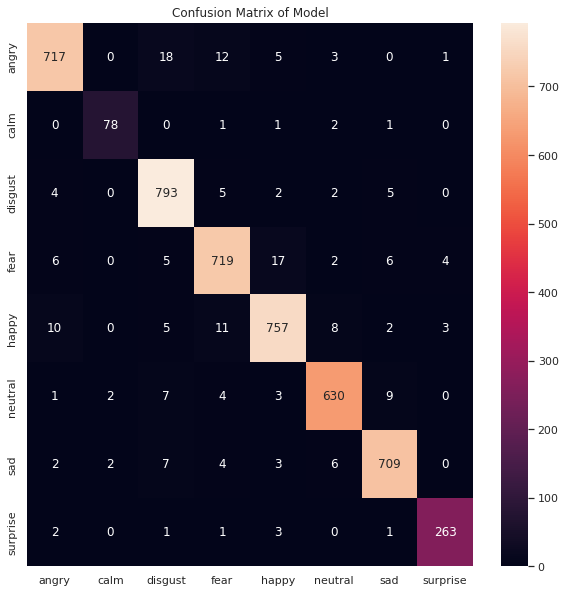

In [70]:
fig = plt.figure(figsize=(10, 10))
plt.title('Confusion Matrix of Model')
plt.xlabel('Predicted')
plt.ylabel('Actual')

cm = multilabel_confusion_matrix(y_check, y_pred)
print(cm, '\n\n\n')

model_matrix = confusion_matrix(y_check, y_pred)
cm = pd.DataFrame(model_matrix,
                  index = [i for i in emotions_classes],
                  columns = [i for i in emotions_classes]
                 )


ax = sns.heatmap(cm,
                 annot = True,
                 fmt = 'd',cbar=True)

print(cm, '\n\n\n')

plt.show()


## 4.6 Classification Report


In [71]:
print('Model Classification Report\n', classification_report(y_check, y_pred, target_names = emotions_classes))


Model Classification Report
               precision    recall  f1-score   support

       angry       0.97      0.95      0.96       756
        calm       0.95      0.94      0.95        83
     disgust       0.95      0.98      0.96       811
        fear       0.95      0.95      0.95       759
       happy       0.96      0.95      0.95       796
     neutral       0.96      0.96      0.96       656
         sad       0.97      0.97      0.97       733
    surprise       0.97      0.97      0.97       271

    accuracy                           0.96      4865
   macro avg       0.96      0.96      0.96      4865
weighted avg       0.96      0.96      0.96      4865



## 4.7 Predict an Unknown Audion File (outside from the four used data sets) In a .wav Format


In [72]:
# Increase ndarray dimensions to [4,2376].
def increase_ndarray_size(features_test):
    tmp = np.zeros([4, 2377])
    offsets = [0, 1]
    insert_here = tuple([slice(offsets[dim], offsets[dim] + features_test.shape[dim]) for dim in range(features_test.ndim)])
    tmp[insert_here] = features_test
    features_test = tmp
    features_test = np.delete(features_test, 0, axis=1)
    return features_test


In [73]:
# Make the prediction.
def predict(features_test):
    features_test = standard_scaler.transform(features_test)
    features_test = np.expand_dims(features_test, axis = 2)
    print('features_test.shape = ', features_test.shape)

    y_pred = model.predict(features_test)
    print('Probabilities for each and every emotion for each and every feature extraction.\n\n',y_pred)
    y_pred = np.argmax(y_pred, axis = 1)
    print('\nPredicted emotion for each and every feature extraction.\n\n', y_pred)
    print('\nemotions_classes = ', emotions_classes)
    try:
        print('\nModel predicted emotion: ', emotions_classes[mode(y_pred)])
    except:
        print('\nModel predicted emotion: ',  emotions_classes[y_pred[0]])
    print('************************************************')


In [81]:
sound_file_path = '../input/randomaudio/dissapointment.wav'
features_test = get_features(sound_file_path)

# Each audio data extraction has its own ndarray.
print(len(features_test))

print('features_test.shape = ', features_test.shape)


if features_test.shape[1] < 2376:
    features_test = increase_ndarray_size(features_test)
    print('features_test.shape = ', features_test.shape)

predict(features_test)

IPython.display.display(IPython.display.Audio(data = sound_file_path))
print('Duration:', librosa.get_duration(filename = sound_file_path))


4
features_test.shape =  (4, 1496)
features_test.shape =  (4, 2376)
features_test.shape =  (4, 2376, 1)
Probabilities for each and every emotion for each and every feature extraction.

 [[4.3126312e-03 1.3940640e-06 3.4473935e-05 4.9121442e-01 5.0418788e-01
  2.0877746e-04 3.6082951e-05 4.3333148e-06]
 [3.0296012e-03 2.5432821e-06 1.1825742e-05 5.3621286e-01 4.5721668e-01
  4.0045325e-04 3.1248808e-03 1.2255798e-06]
 [1.4740692e-03 3.6920976e-06 1.1821085e-06 7.4861515e-01 2.4973075e-01
  1.6045687e-04 1.2698903e-05 1.9785227e-06]
 [8.2949345e-04 1.7259019e-05 3.0861150e-07 6.7759126e-01 3.1035811e-01
  3.2768122e-04 1.0875773e-02 7.9094967e-08]]

Predicted emotion for each and every feature extraction.

 [4 3 3 3]

emotions_classes =  ['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

Model predicted emotion:  fear
************************************************


Duration: 2.1594375


## 4.8 Predict an Audion File That is a Combination of Two Unknown Audio Files in a .wav Format


In [75]:
# Simple manual speration of audio files. Only good if the audio file is small.

sound = AudioSegment.from_wav('../input/randomaudio/disgust_angry.wav')

two_seconds = 2 * 1000 # 2000

first_two_seconds = sound[:two_seconds]
last_four_seconds = sound[-4000:]

first_two_seconds.export('first_two_seconds.wav', format = 'wav')
last_four_seconds.export('last_four_seconds.wav', format = 'wav')

features_test_1 = get_features('./first_two_seconds.wav')
features_test_2 = get_features('./last_four_seconds.wav')


print('features_test_1.shape = ', features_test_1.shape)
print('features_test_2.shape = ', features_test_2.shape)
print('************************************************')

if features_test_1.shape[1] < 2376:
    features_test_1 = increase_ndarray_size(features_test_1)
    print('features_test_1.shape = ', features_test_1.shape)

if (features_test_2.shape[1]) < 2376:
    features_test_2 = increase_ndarray_size(features_test_2)
    print('features_test_2.shape = ', features_test_2.shape)

print('************************************************')

predict(features_test_1)
print('************************************************')
predict(features_test_2)


features_test_1.shape =  (4, 1342)
features_test_2.shape =  (4, 2376)
************************************************
features_test_1.shape =  (4, 2376)
************************************************
features_test.shape =  (4, 2376, 1)
Probabilities for each and every emotion for each and every feature extraction.

 [[3.8418184e-06 2.4465564e-15 9.9799699e-01 5.7005995e-08 1.9991407e-03
  1.0869485e-10 7.0065420e-14 1.2790826e-11]
 [1.4456035e-05 1.6181651e-13 9.9652618e-01 2.3389202e-06 3.4569066e-03
  4.1471495e-08 1.1909501e-13 3.8525860e-11]
 [3.4569163e-07 7.9888563e-14 9.9967039e-01 1.1557768e-06 3.2808451e-04
  5.8614327e-09 2.9044874e-13 4.2134829e-12]
 [9.2279617e-10 1.6022699e-15 9.9999714e-01 1.9687201e-09 2.8495142e-06
  2.4727348e-10 5.4286443e-15 5.3823550e-14]]

Predicted emotion for each and every feature extraction.

 [2 2 2 2]

emotions_classes =  ['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

Model predicted emotion:  disgust
********

## 4.9 Fast/Automatic Way to Split Audio Files Into Chunks of 2.5 Seconds Audio Files (in ***4.8*** it was done manually which is not ideal for large audio file splitting)


> ## 4.9.1 Remove the Silence Gaps to Do Not Interfere With the Prediction of the Model


In [76]:
file = '../input/randomaudio/angry_disgust_fear_happy_sad.wav'
sound = AudioSegment.from_wav(file)
audio_chunks = split_on_silence(sound,
                                min_silence_len = 100,
                                silence_thresh = -45,
                                keep_silence = 50)

# Putting the file back together.
combined = AudioSegment.empty()
for chunk in audio_chunks:
    combined += chunk
    combined.export('audio_no_silence_gap.wav', format = 'wav')

IPython.display.display(IPython.display.Audio(data = './audio_no_silence_gap.wav'))


> ### 4.9.2 Split Automatically Based on Time of 2.5 Seconds (more accurate method as model was trained on audio files that were about 2.5 seconds)


In [77]:
start = 0
end = librosa.get_duration(filename = './audio_no_silence_gap.wav') * 1000 # pydub works in milliseconds. liborsa works in seconds.

# Replace number 2.5 with the number of desired seconds that each audio file will be after the splitting.
# Model was train on about 2.5 seconds audio recordings.
time_change = 2.5 * 1000 # In milliseconds.
count = 0
for i in np.arange(start, end, time_change):
    if i != 0 :
        tmp = sound[i - 500:i + time_change] # Decrease by 500 milliseconds(0.5 seconds) to get a sense of the previous audio split.
    else:
        tmp = sound[i:i + time_change]
    tmp.export('audio_split_' + str(count) + '.wav', format = 'wav')
    print('Exporting file:', 'audio_split_' + str(count) + '.wav')
    count += 1


Exporting file: audio_split_0.wav
Exporting file: audio_split_1.wav
Exporting file: audio_split_2.wav
Exporting file: audio_split_3.wav
Exporting file: audio_split_4.wav
Exporting file: audio_split_5.wav
Exporting file: audio_split_6.wav


In [78]:
# # Split Automatically Based On Silence Detected Between Sounds (Less Accurate Method Because It Produces Audio Files With Less Than Or Greater Than 2.5 Seconds Duration)

# # Reading from audio .wav file.
# file = '../input/randomaudio/angry_disgust_fear_happy_sad.wav'
# song = AudioSegment.from_wav(file)
# IPython.display.display(IPython.display.Audio(data = file))

# # Spliting audio files.
# audio_splits = split_on_silence(audio_segment = song, min_silence_len = 900, silence_thresh = -40)
# count = 0
# # Loop is used to iterate over the output list.
# for i, split in enumerate(audio_chunks):
#     split.export('audio_split_' + str(count) + '.wav', format = 'wav')
#     print('Exporting file:', 'audio_split_' + str(count) + '.wav')
#     count += 1
    

In [79]:
# # Delete unecessary output files in /kaggle/working

# for dirname, _, filenames in os.walk('/kaggle/working/'):
#     for filename in filenames:
#         if 'state.db' not in filename:
#             os.remove(filename)


> ## 4.10 Make Predictions in Another Language Other Than English


In [80]:
# Load the splitted audio files.
splitted_audio_path_list = []
splitted_audio_count = 0

for dirname, _, filenames in os.walk('/kaggle/working/'):
    for filename in filenames:
        if 'audio_split_' in filename: 
            splitted_audio_path_list.append(os.path.join(dirname, filename))
            splitted_audio_count += 1

# Sort the splitted_audio_path_list beacuse kaggle inserts the splitted audio files paths in reverse order.
print(splitted_audio_path_list)
splitted_audio_path_list.sort()
print(splitted_audio_path_list)

#print('\nLength of splitted_audio_path_list=', len(splitted_audio_path_list))
print('splitted_audio_path_list[0]=', splitted_audio_path_list[0])
print('splitted_audio_count(audio files)=', splitted_audio_count)


# Play all the splitted audio files.
print('\nAll Audio Files.\n')
for i in splitted_audio_path_list:
    print(i)
    IPython.display.display(IPython.display.Audio(data = i))

# Get only the audio files that have a durationg greater than or equal to 2.5 seconds.
valid_features_tests_paths = []
for features_test_path in splitted_audio_path_list:
    duration = librosa.get_duration(filename = features_test_path)
    print('Duration of', features_test_path, ' =', duration)
    
    if duration >= 2.5:
        valid_features_tests_paths.append(features_test_path)   

# Play only the valid splitted audio files.
print('\nOnly Valid Audio Files.\n')
for valid_features_tests_path in valid_features_tests_paths:
    print(valid_features_tests_path)
    IPython.display.display(IPython.display.Audio(data = valid_features_tests_path))

# Extract the audio data features from each valid audio file.
features_tests = []
for valid_features_tests_path in valid_features_tests_paths:
    features_tests.append(get_features(valid_features_tests_path))

# Check the shape of each features_test.
print('\n Check shape\n')
for i in range(len(features_tests)):
    print('Audio:(',i , ') shape =  ', features_tests[i].shape, sep = '')
print('************************************************')


# Make all features_tests equal in shape and dimensions. All mus be (4,2376) which is 4 rows and 2376 columns.
# Make a new  list for the features_tests because after the for loop finishes execution the data is being reset.
features_tests_equal_dimensions = []
print('\n Change shape\n')
for features_test in features_tests:
    if features_test.shape[1] < 2376:
        features_test = increase_ndarray_size(features_test)
    features_tests_equal_dimensions.append(features_test)

for i in range(len(features_tests_equal_dimensions)):
    print('Audio:(',i , ') shape =  ', features_tests_equal_dimensions[i].shape, sep = '')
print('************************************************\n\n\n')

for i in range(len(features_tests_equal_dimensions)):
    predict(features_tests_equal_dimensions[i])


['/kaggle/working/audio_split_1.wav', '/kaggle/working/audio_split_4.wav', '/kaggle/working/audio_split_5.wav', '/kaggle/working/audio_split_2.wav', '/kaggle/working/audio_split_3.wav', '/kaggle/working/audio_split_0.wav', '/kaggle/working/audio_split_6.wav']
['/kaggle/working/audio_split_0.wav', '/kaggle/working/audio_split_1.wav', '/kaggle/working/audio_split_2.wav', '/kaggle/working/audio_split_3.wav', '/kaggle/working/audio_split_4.wav', '/kaggle/working/audio_split_5.wav', '/kaggle/working/audio_split_6.wav']
splitted_audio_path_list[0]= /kaggle/working/audio_split_0.wav
splitted_audio_count(audio files)= 7

All Audio Files.

/kaggle/working/audio_split_0.wav


/kaggle/working/audio_split_1.wav


/kaggle/working/audio_split_2.wav


/kaggle/working/audio_split_3.wav


/kaggle/working/audio_split_4.wav


/kaggle/working/audio_split_5.wav


/kaggle/working/audio_split_6.wav


Duration of /kaggle/working/audio_split_0.wav  = 2.5
Duration of /kaggle/working/audio_split_1.wav  = 3.0
Duration of /kaggle/working/audio_split_2.wav  = 3.0
Duration of /kaggle/working/audio_split_3.wav  = 3.0
Duration of /kaggle/working/audio_split_4.wav  = 3.0
Duration of /kaggle/working/audio_split_5.wav  = 3.0
Duration of /kaggle/working/audio_split_6.wav  = 2.66

Only Valid Audio Files.

/kaggle/working/audio_split_0.wav


/kaggle/working/audio_split_1.wav


/kaggle/working/audio_split_2.wav


/kaggle/working/audio_split_3.wav


/kaggle/working/audio_split_4.wav


/kaggle/working/audio_split_5.wav


/kaggle/working/audio_split_6.wav



 Check shape

Audio:(0) shape =  (4, 1804)
Audio:(1) shape =  (4, 2288)
Audio:(2) shape =  (4, 2288)
Audio:(3) shape =  (4, 2288)
Audio:(4) shape =  (4, 2288)
Audio:(5) shape =  (4, 2288)
Audio:(6) shape =  (4, 1958)
************************************************

 Change shape

Audio:(0) shape =  (4, 2376)
Audio:(1) shape =  (4, 2376)
Audio:(2) shape =  (4, 2376)
Audio:(3) shape =  (4, 2376)
Audio:(4) shape =  (4, 2376)
Audio:(5) shape =  (4, 2376)
Audio:(6) shape =  (4, 2376)
************************************************



features_test.shape =  (4, 2376, 1)
Probabilities for each and every emotion for each and every feature extraction.

 [[7.6794684e-01 3.1587693e-05 1.8043403e-03 1.8344805e-02 3.2730822e-02
  1.7759408e-01 1.5157206e-03 3.1768563e-05]
 [3.0502873e-03 2.3769731e-05 8.6823739e-02 5.5475311e-06 8.3357953e-02
  8.1729007e-01 9.2055378e-03 2.4305364e-04]
 [1.5387556e-01 6.2484114e-06 7.6584350e-03 8.2686609e-01 1.0902414e-02
  6.5676798e-04 6.0532807e-06 2.842113